<div class="alert alert-block alert-warning">
 

# **Note Climatological windows for climate analysis**

</div>

- **1961 - 1990**  
- **1981 - 2000**
- **1991 -2020**

<div class="alert alert-block alert-info">
   

 # **LAB EXERCISES**


</div>

In [25]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np
from matplotlib.ticker import MultipleLocator
import os
from matplotlib.colors import TwoSlopeNorm
from IPython.display import display

<div class="alert alert-block alert-info">

# **TOA Net Incoming Solar Radiation (1961 - 1990)**
</div>

In [26]:
%%bash
cdo yearmean TOA_solar_61_90.nc TOA_solar_61_90_ymean.nc
cdo timmean TOA_solar_61_90_ymean.nc global_TOA_solar_61_90.nc

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


In [27]:
o =xr.open_dataset('TOA_solar_61_90.nc')
o

<xarray.Dataset> Size: 1GB
Dimensions:     (valid_time: 360, latitude: 721, longitude: 1440)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 3kB 1961-01-01T06:00:00 ... 1990-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 6kB ...
Data variables:
    avg_tnswrf  (valid_time, latitude, longitude) float32 1GB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts

In [28]:
toa = xr.open_dataset('global_TOA_solar_61_90.nc')
toa

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 1975-12-16T06:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_tnswrf       (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Sun Apr 20 12:13:33 2025: cdo timmean TOA_solar_...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [29]:
ts = toa['avg_tnswrf'] 
ts

<xarray.DataArray 'avg_tnswrf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
[1038240 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 1975-12-16T06:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Attributes: (12/33)
    standard_name:                            unknown
    long_name:                                Time-mean top net short-wave ra...
    units:                                    W m**-2
    cell_methods:                             valid_time: mean
    GRIB_paramId:                             235039
    GRIB_dataType:                            fc
    ...                                       ...
    GRIB_missingValue:                        3.4028234663852886e+38
    GRIB_name:                                Time-mean top net short-wave ra...
    GRIB_shortName:                           avg_tnswrf
    GRIB_totalNumber:                         0
    GRIB_units:                               W m**-2
    GRIB_surface:                             0.0

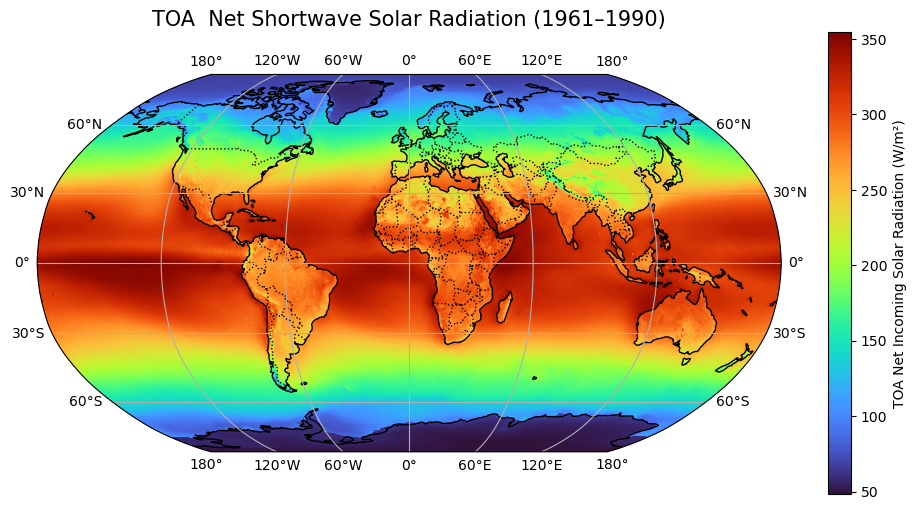

In [30]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

ts.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="turbo", cbar_kwargs={"label": "TOA Net Incoming Solar Radiation (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title("TOA  Net Shortwave Solar Radiation (1961–1990)", fontsize=15, pad=20)

# Save the plot
plt.savefig("TOA  Net Solar Radiation.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **TOA Net Outgoing Longwave Radiation (1961 - 2020)**
</div>



In [31]:
%%bash
cdo yearmean TOP_long.nc ytop_long.nc
cdo timmean ytop_long.nc cltop_long.nc
echo 'All done'

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


All done


In [32]:
top =  xr.open_dataset('cltop_long.nc')
top

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_tnlwrf       (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Sun Apr 20 12:13:58 2025: cdo timmean ytop_long....
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [33]:
ds = xr.open_dataset('global_longwave.nc')
ds

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 1975-12-16T06:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_tnlwrf       (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Fri Mar 21 16:56:29 2025: cdo timmean longwave_y...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [34]:
var = top['avg_tnlwrf']*-1
var

<xarray.DataArray 'avg_tnlwrf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
array([[[193.70496, 193.70496, 193.70496, ..., 193.70496, 193.70496,
         193.70496],
        [193.69743, 193.69789, 193.69823, ..., 193.69734, 193.69737,
         193.6974 ],
        [193.75467, 193.75536, 193.75609, ..., 193.75435, 193.75436,
         193.7545 ],
        ...,
        [146.52925, 146.5298 , 146.5308 , ..., 146.52914, 146.52974,
         146.52992],
        [146.38126, 146.38216, 146.38284, ..., 146.38048, 146.3807 ,
         146.38103],
        [145.83334, 145.83334, 145.83334, ..., 145.83334, 145.83334,
         145.83334]]], dtype=float32)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0

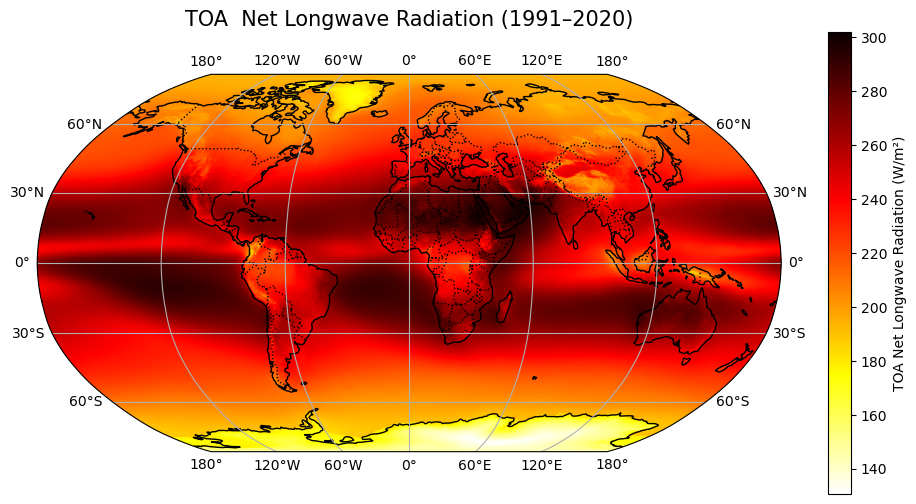

In [35]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

var.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="hot_r", cbar_kwargs={"label": "TOA Net Longwave Radiation (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title("TOA  Net Longwave Radiation (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("TOA  Net Longwave Radiation_91_20.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

In [36]:
outcome = ds['avg_tnlwrf'] * -1
outcome

<xarray.DataArray 'avg_tnlwrf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
array([[[192.04578, 192.04578, 192.04578, ..., 192.04578, 192.04578,
         192.04578],
        [192.09586, 192.09604, 192.09625, ..., 192.09615, 192.09604,
         192.09587],
        [192.20375, 192.20396, 192.20432, ..., 192.20433, 192.2042 ,
         192.20413],
        ...,
        [146.16579, 146.1666 , 146.16782, ..., 146.16577, 146.16635,
         146.16634],
        [146.00157, 146.00262, 146.00365, ..., 146.001  , 146.0011 ,
         146.00139],
        [145.41286, 145.41286, 145.41286, ..., 145.41286, 145.41286,
         145.41286]]], dtype=float32)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 1975-12-16T06:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0

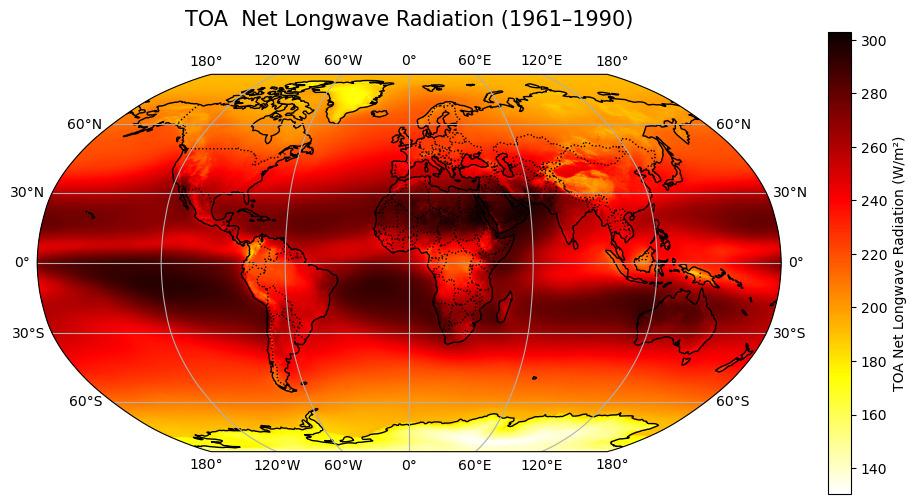

In [37]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

outcome.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="hot_r", cbar_kwargs={"label": "TOA Net Longwave Radiation (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title("TOA  Net Longwave Radiation (1961–1990)", fontsize=15, pad=20)

# Save the plot
plt.savefig("TOA  Net Longwave Radiation.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **TOA Shortwave Incoming Solar Radiation (1991 - 2020)**
</div>



In [38]:
sh = xr.open_dataset('global_TOA_solar.nc')
sh

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_tnswrf       (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Fri Mar 21 19:03:12 2025: cdo timmean TOA_solar_...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [39]:
toa_s = sh['avg_tnswrf']
toa_s

<xarray.DataArray 'avg_tnswrf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
[1038240 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Attributes: (12/33)
    standard_name:                            unknown
    long_name:                                Time-mean top net short-wave ra...
    units:                                    W m**-2
    cell_methods:                             valid_time: mean
    GRIB_paramId:                             235039
    GRIB_dataType:                            fc
    ...                                       ...
    GRIB_missingValue:                        3.4028234663852886e+38
    GRIB_name:                                Time-mean top net short-wave ra...
    GRIB_shortName:                           avg_tnswrf
    GRIB_totalNumber:                         0
    GRIB_units:                               W m**-2
    GRIB_surface:                             0.0

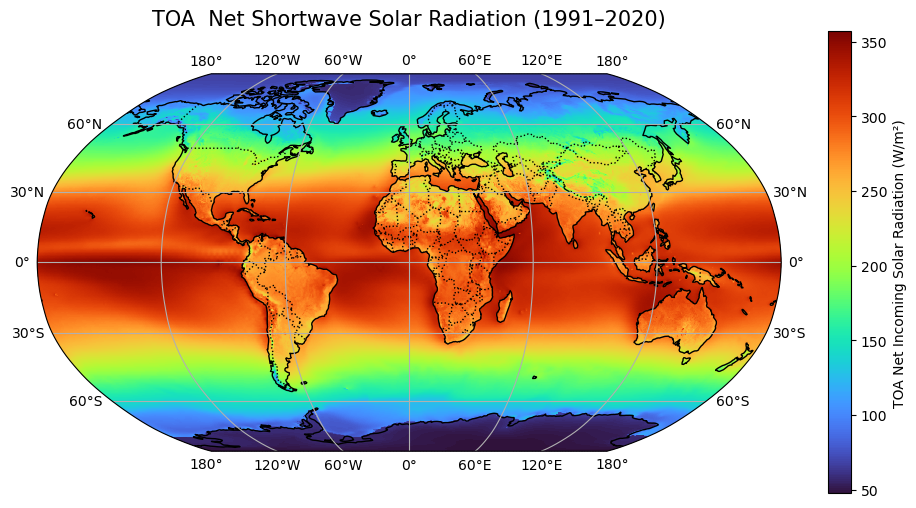

In [40]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

toa_s.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="turbo", cbar_kwargs={"label": "TOA Net Incoming Solar Radiation (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title("TOA  Net Shortwave Solar Radiation (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("TOA Net Solar Radiation-1991-2020.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **Zonal Means**
</div>

 

In [2]:
%%bash
cdo ymonmean TOA_Solar.nc TOA_solar_ymmean.nc
cdo zonmean TOA_solar_ymmean.nc zonal_monthly_mean.nc
echo "Process completed"

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Process completed


In [2]:
# Load the zonal monthly mean data
ds = xr.open_dataset('zonal_monthly_mean.nc')
ds

<xarray.Dataset> Size: 41kB
Dimensions:          (valid_time: 12, bnds: 2, lon: 1, lat: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 96B 2020-01-01T06:00:00 ... ...
  * lon              (lon) float64 8B 0.0
  * lat              (lat) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 192B ...
    avg_tnswrf       (valid_time, lat, lon) float32 35kB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Thu Apr 10 14:49:11 2025: cdo zonmean TOA_solar_...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

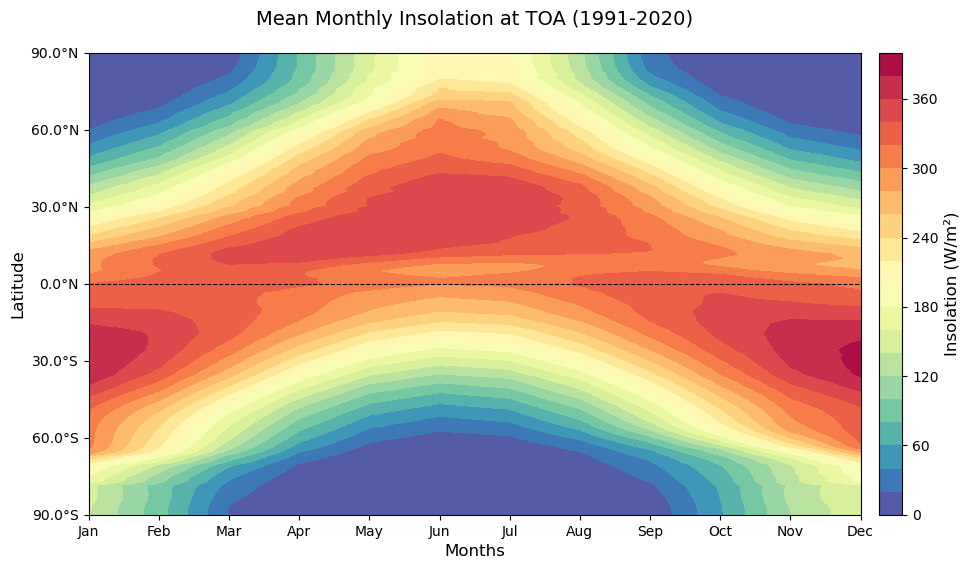

In [3]:

data = ds['avg_tnswrf'].squeeze()

# Create latitude labels with N/S
def lat_formatter(lat):
    return f"{abs(lat):.1f}°{'N' if lat >=0 else 'S'}"

# Create the plot
plt.figure(figsize=(12, 6))

# Plot data (transposed for correct orientation)
contour = plt.contourf(np.arange(1,13), data.lat, data.T, 
                      levels=20, cmap='Spectral_r')

# Add colorbar
cbar = plt.colorbar(contour, pad=0.02)
cbar.set_label('Insolation (W/m²)', fontsize=12)

# Format axes
plt.xticks(np.arange(1,13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks(np.linspace(-90, 90, 7), [lat_formatter(x) for x in np.linspace(-90, 90, 7)])

# Add labels and title
plt.xlabel('Months', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.title('Mean Monthly Insolation at TOA (1991-2020)', fontsize=14, pad=20)

# Add equator line
plt.axhline(0, color='black', linestyle='--', linewidth=0.8)

# Save and show
plt.savefig("TOA_zonal_mean.png", dpi=300, bbox_inches="tight")
plt.show()

<div class="alert alert-block alert-info">

### **Zonal means of Shortwave and Longwave at TOA**

</div>

In [ ]:
%%bash
cdo timmean TOA_Solar.nc asr_annual.nc  # Absorbed Solar Radiation (ASR)
cdo timmean TOP_long.nc olr_annual.nc  # Outgoing Longwave Radiation (OLR)
echo "Processed Annual Climatotogy means"

cdo zonmean asr_annual.nc asr_zonal.nc  # zonal mean (solar radiation
cdo zonmean olr_annual.nc olr_zonal.nc  # Zonal mean Longwave)


# Difference 
cdo sub asr_zonal.nc olr_zonal.nc net_radiation_imbalance.nc

echo "All processed"

In [62]:
net = xr.open_dataset('net_radiation_imbalance.nc')
net

<xarray.Dataset> Size: 9kB
Dimensions:          (valid_time: 1, bnds: 2, lon: 1, lat: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-16T18:00:00
  * lon              (lon) float64 8B 0.0
  * lat              (lat) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_tnswrf       (valid_time, lat, lon) float32 3kB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Thu Apr 10 18:19:10 2025: cdo sub asr_zonal.nc o...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

Successfully saved: zonal_radiation_balance.png


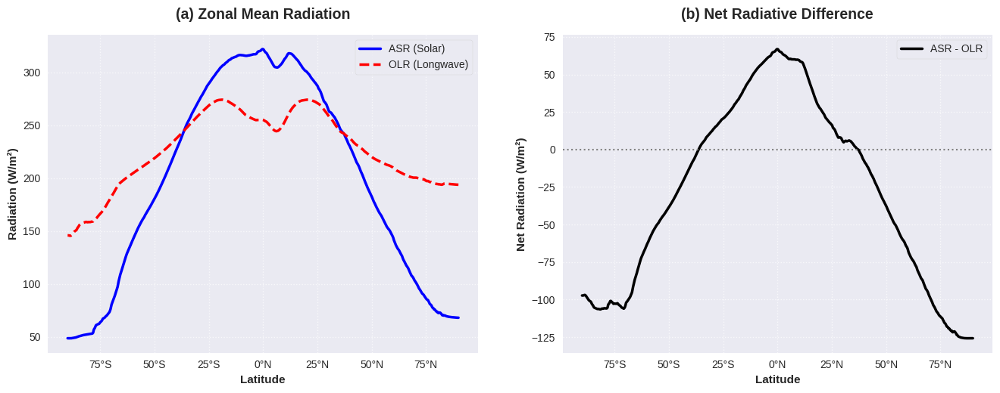

In [17]:


# Load data
try:
    asr = xr.open_dataset('asr_zonal.nc')['avg_tnswrf'].squeeze()
    olr = xr.open_dataset('olr_zonal.nc')['avg_tnlwrf'].squeeze() * -1
    net = xr.open_dataset('net_radiation_imbalance.nc')['avg_tnswrf'].squeeze()
except FileNotFoundError as e:
    raise FileNotFoundError(f"Data file not found: {e.filename}") from e

# Create latitude labels with N/S
def lat_formatter(x, pos):
    return f"{abs(x):g}°{'N' if x >=0 else 'S'}"

# Set up figure with improved styling
available_styles = plt.style.available
style_to_use = 'seaborn-v0_8' if 'seaborn-v0_8' in available_styles else 'ggplot'
plt.style.use(style_to_use)

plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold'
})

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
net_fixed = asr - olr

# Left plot - ASR/OLR
ax1.plot(asr.lat, asr, 'b-', linewidth=2.5, label='ASR (Solar)')
ax1.plot(olr.lat, olr, 'r--', linewidth=2.5, label='OLR (Longwave)')
ax1.set_xlabel('Latitude', fontweight='bold')
ax1.set_ylabel('Radiation (W/m²)', fontweight='bold')
ax1.set_title('(a) Zonal Mean Radiation', pad=15)
ax1.legend(frameon=True)
ax1.grid(linestyle=':', alpha=0.7)
ax1.xaxis.set_major_formatter(plt.FuncFormatter(lat_formatter))

# Right plot - Net balance
ax2.plot(asr.lat, net_fixed, 'k-', linewidth=2.5, label='ASR - OLR')
ax2.axhline(0, color='gray', linestyle=':', linewidth=1.5)
ax2.set_xlabel('Latitude', fontweight='bold')
ax2.set_ylabel('Net Radiation (W/m²)', fontweight='bold')
ax2.set_title('(b) Net Radiative Difference', pad=15)
ax2.legend(frameon=True)
ax2.grid(linestyle=':', alpha=0.7)
ax2.xaxis.set_major_formatter(plt.FuncFormatter(lat_formatter))

# Final adjustments and save
plt.tight_layout(pad=3.0)
try:
    plt.savefig("zonal_radiation_balance.png", 
                dpi=300, 
                bbox_inches="tight", 
                facecolor='white')
    print("Successfully saved: zonal_radiation_balance.png")
except Exception as e:
    print(f"Error saving plot: {str(e)}")
plt.show()

<div class="alert alert-block alert-info">

### **Net_surface Radiation (Rs)**

</div>

In [13]:
sur = xr.open_dataset('Net_surface_rad.nc')
sur

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_snswrf       (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Fri Mar 21 17:51:56 2025: cdo timmean Net_surfac...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [14]:
surface_rs = sur['avg_snswrf'] 
surface_rs

<xarray.DataArray 'avg_snswrf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
[1038240 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Attributes: (12/33)
    standard_name:                            unknown
    long_name:                                Time-mean surface net short-wav...
    units:                                    W m**-2
    cell_methods:                             valid_time: mean
    GRIB_paramId:                             235037
    GRIB_dataType:                            fc
    ...                                       ...
    GRIB_missingValue:                        3.4028234663852886e+38
    GRIB_name:                                Time-mean surface net short-wav...
    GRIB_shortName:                           avg_snswrf
    GRIB_totalNumber:                         0
    GRIB_units:                               W m**-2
    GRIB_surface:                             0.0

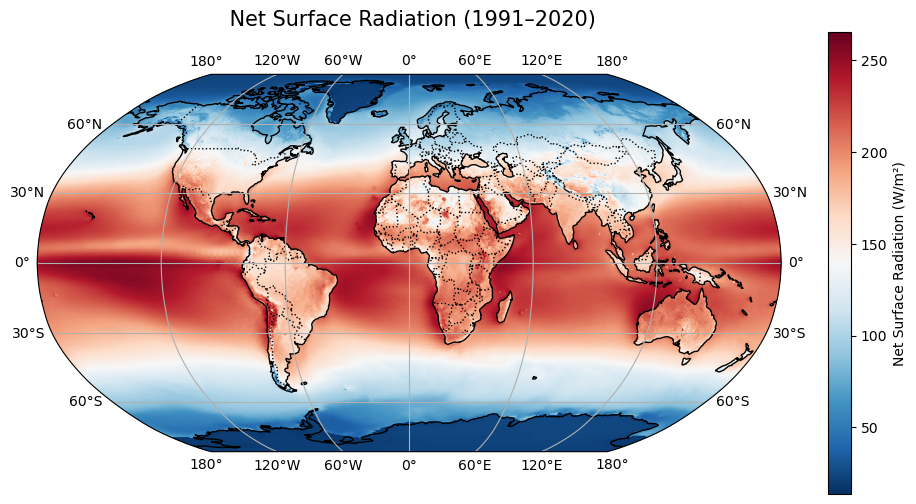

In [15]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

surface_rs.plot(ax=ax, transform=ccrs.PlateCarree(), cmap="RdBu_r" , cbar_kwargs={"label": "Net Surface Radiation (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title(" Net Surface Radiation (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("Net Surface Radiation.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **Latent Heat flux**

</div>

In [16]:
data = xr.open_dataset('global_latentheat.nc')
data

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_slhtf        (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Fri Mar 21 18:39:55 2025: cdo timmean lateheat_y...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [17]:
latent = data['avg_slhtf'] * -1
latent

<xarray.DataArray 'avg_slhtf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
array([[[ 4.596852  ,  4.596852  ,  4.596852  , ...,  4.596852  ,
          4.596852  ,  4.596852  ],
        [ 4.5238266 ,  4.523978  ,  4.5242605 , ...,  4.5241523 ,
          4.5241737 ,  4.524109  ],
        [ 4.6044474 ,  4.605315  ,  4.60614   , ...,  4.603666  ,
          4.603471  ,  4.6039267 ],
        ...,
        [-0.29772288, -0.297788  , -0.29787478, ..., -0.29741907,
         -0.29752758, -0.2976578 ],
        [-0.29407704, -0.29418555, -0.29429406, ..., -0.29396853,
         -0.29392514, -0.29390344],
        [-0.28381228, -0.28381228, -0.28381228, ..., -0.28381228,
         -0.28381228, -0.28381228]]], dtype=float32)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0

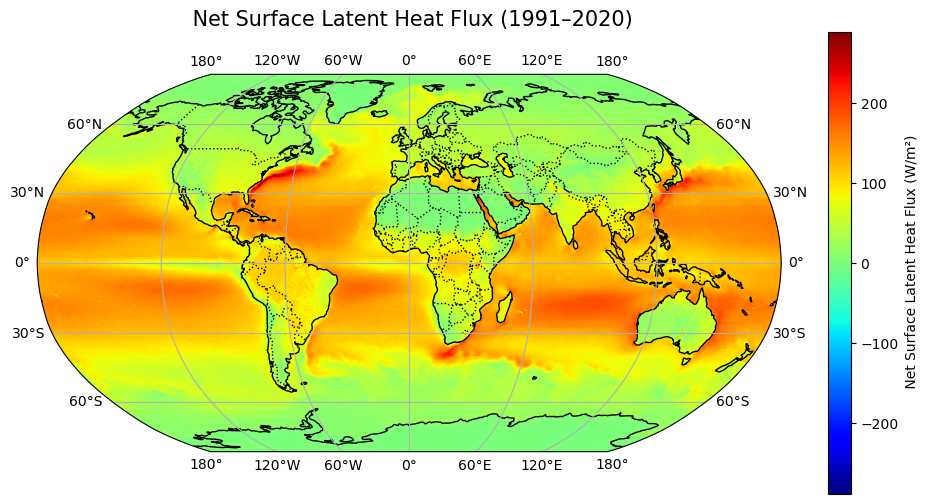

In [18]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

latent.plot(ax=ax, transform=ccrs.PlateCarree(), cmap= "jet", cbar_kwargs={"label": " Net Surface Latent Heat Flux (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title(" Net Surface Latent Heat Flux (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("Surface Latent Heat Flux.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **Sensible Heat Flux**
</div>

In [19]:
sens =  xr.open_dataset("global_sensible.nc")
sens

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    avg_ishf         (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Fri Mar 21 18:48:39 2025: cdo timmean sensible_y...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [20]:
sensible = sens['avg_ishf'] * -1
sensible

<xarray.DataArray 'avg_ishf' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
array([[[ -2.0672076,  -2.0672076,  -2.0672076, ...,  -2.0672076,
          -2.0672076,  -2.0672076],
        [ -2.002939 ,  -2.000888 ,  -1.998794 , ...,  -2.0060856,
          -2.0049462,  -2.0039914],
        [ -1.897416 ,  -1.8948009,  -1.8911225, ...,  -1.9017236,
          -1.8997705,  -1.8982948],
        ...,
        [-18.347254 , -18.354687 , -18.363724 , ..., -18.324022 ,
         -18.331585 , -18.339277 ],
        [-17.64082  , -17.646147 , -17.651495 , ..., -17.629946 ,
         -17.63356  , -17.637184 ],
        [-16.115568 , -16.115568 , -16.115568 , ..., -16.115568 ,
         -16.115568 , -16.115568 ]]], dtype=float32)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0

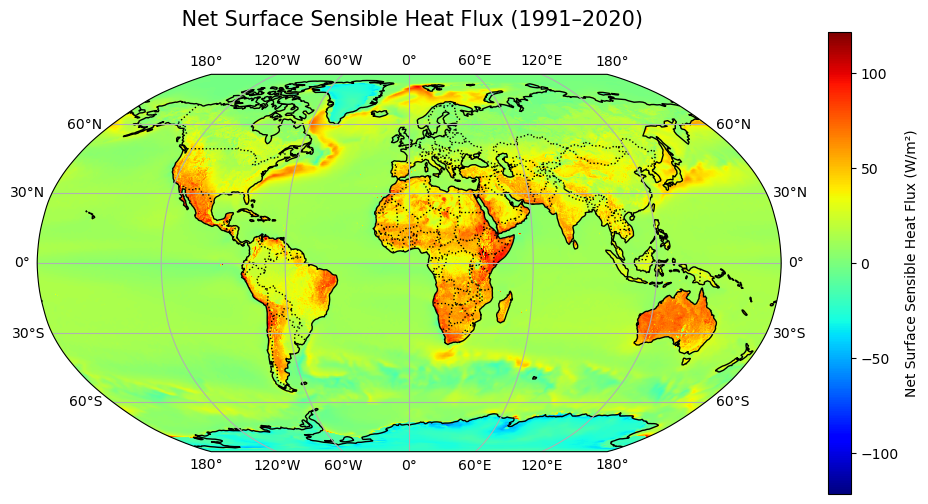

In [21]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

sensible.plot(ax=ax, transform=ccrs.PlateCarree(), cmap= "jet", cbar_kwargs={"label": "Net Surface Sensible Heat Flux (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title(" Net Surface Sensible Heat Flux (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("Surface Sensible Heat Flux.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

# **Net Global_heat Storage**
</div>

In [ ]:
%%bash

# Input files
rs_file="Net_surface.nc"  # Solar Radiation (avg_snswrf)
lh_file="Net_latentheat.nc"  # Latent Heat Flux (avg_slhtf)
sh_file="Net_sensible.nc"  # Sensible Heat Flux (avg_ishf)

# Output files
gh_file="ground_heat.nc"
yearmean_gh_file="gh.nc"
global_gh_file="global_gh.nc"

# Compute Ground Heat (GH)
echo "Computing Ground Heat (GH)..."
cdo expr,'gh=avg_snswrf-(avg_slhtf*-1)-(avg_ishf*-1)' $rs_file $lh_file $sh_file $gh_file

# Calculate Yearly Mean
echo "Calculating Yearly Mean..."
cdo yearmean $gh_file $yearmean_gh_file

# Calculate Time Mean
echo "Calculating Time Mean..."
cdo timmean $yearmean_gh_file $global_gh_file

# Plot the Data
echo "Plotting the Data..."
ncview $global_gh_file &

echo "Process completed. Check the output files and plot."

In [23]:
ground = xr.open_dataset('global_gh.nc')
ground

<xarray.Dataset> Size: 4MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    gh               (valid_time, latitude, longitude) float32 4MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Wed Apr 02 00:26:08 2025: cdo timmean gh.nc glob...
    frequency:               year
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

In [24]:
gh = ground['gh']
gh

<xarray.DataArray 'gh' (valid_time: 1, latitude: 721, longitude: 1440)> Size: 4MB
[1038240 values with dtype=float32]
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 8B 2005-12-15T18:00:00
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
Attributes:
    cell_methods:  valid_time: mean

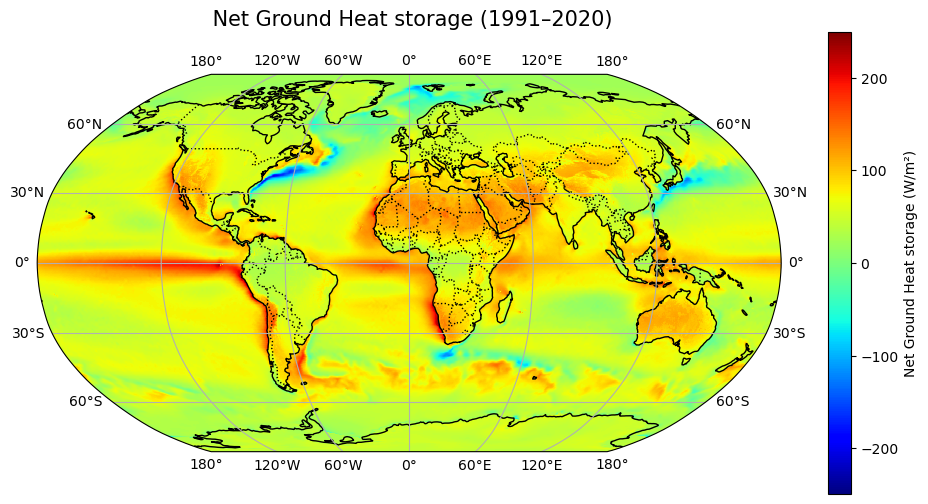

In [25]:
# Create the plot
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.Robinson())

gh.plot(ax=ax, transform=ccrs.PlateCarree(), cmap= "jet", cbar_kwargs={"label": "Net Ground Heat storage (W/m²)"})
# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND)

# Add gridlines
ax.gridlines(draw_labels=True)

# Add title
plt.title(" Net Ground Heat storage (1991–2020)", fontsize=15, pad=20)

# Save the plot
plt.savefig("Net Ground Heat storage.png", dpi=300, bbox_inches="tight")

# Show the plot
plt.show()

<div class="alert alert-block alert-info">


# **Seasonal Variation of the Surface Energy Balance**
</div>

### Shell Script for Data Processing

This script processes climate data files to extract specific variables, calculate ground heat storage, and compute monthly means. The steps are as follows:

1. Extract data for a Savanah region in Ghana (latitude: 9.08333300, longitude: -1.81666700).
2. Calculate ground heat storage (GH = Rs - Lh - Sh).
3. Compute monthly means for each variable.

In [26]:
%%bash
# Input files for each variable
rs_file="Net_surface.nc"  # Solar Radiation (avg_snswrf)
lh_file="Net_latentheat.nc"  # Latent Heat Flux (avg_slhtf)
sh_file="Net_sensible.nc"  # Sensible Heat Flux (avg_ishf)

# Output directory for saving processed files
output_dir="output_files"
mkdir -p "$output_dir"

#  Extract data for the specific point (latitude: 9.08333300, longitude: -1.81666700)
savannah_rs="${output_dir}/savannah_rs.nc"
cdo -remapnn,lon=-1.8166670_lat=9.08333300 "$rs_file" "$savannah_rs"

savannah_lh="${output_dir}/savannah_lh.nc"
cdo -remapnn,lon=-1.8166670_lat=9.08333300 "$lh_file" "$savannah_lh"

savannah_sh="${output_dir}/savannah_sh.nc"
cdo -remapnn,lon=-1.8166670_lat=9.08333300 "$sh_file" "$savannah_sh"

# Calculate Ground Heat Storage (GH = Rs - Lh - Sh)
savannah_gh="${output_dir}/savannah_gh.nc"
cdo expr,'GH=avg_snswrf-(avg_slhtf*-1)-(avg_ishf*-1)' -merge "$savannah_rs" "$savannah_lh" "$savannah_sh" "$savannah_gh"

#  Calculate monthly means for each variable
rs_monthly="${output_dir}/rs_monthly.nc"
cdo ymonmean "$savannah_rs" "$rs_monthly"

lh_monthly="${output_dir}/lh_m# onthly.nc"
cdo ymonmean "$savannah_lh" "$lh_monthly"

sh_monthly="${output_dir}/sh_monthly.nc"
cdo ymonmean "$savannah_sh" "$sh_monthly"

gh_monthly="${output_dir}/gh_monthly.nc"
cdo ymonmean "$savannah_gh" "$gh_monthly"

echo "Data processing complete. Output files saved in: $output_dir"

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


cdo    remapnn: Nearest neighbor weights from lonlat (1440x721) to lonlat (1x1) grid


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


cdo    remapnn: Nearest neighbor weights from lonlat (1440x721) to lonlat (1x1) grid


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


cdo    remapnn: Nearest neighbor weights from lonlat (1440x721) to lonlat (1x1) grid



cdo (Abort): 
ymonmean output_files/savannah_lh.nc [ output_files/lh_m# onthly.nc ]  
                                ^ Bracket not closed


Data processing complete. Output files saved in: output_files


### Another way is to use the monthly mean data and averaged it again to get 1D spatial mean if i dont compute the fldmean

Successfully saved: Seasonal_Variation_of_Energy_Fluxes_Savannah_Ghana.png


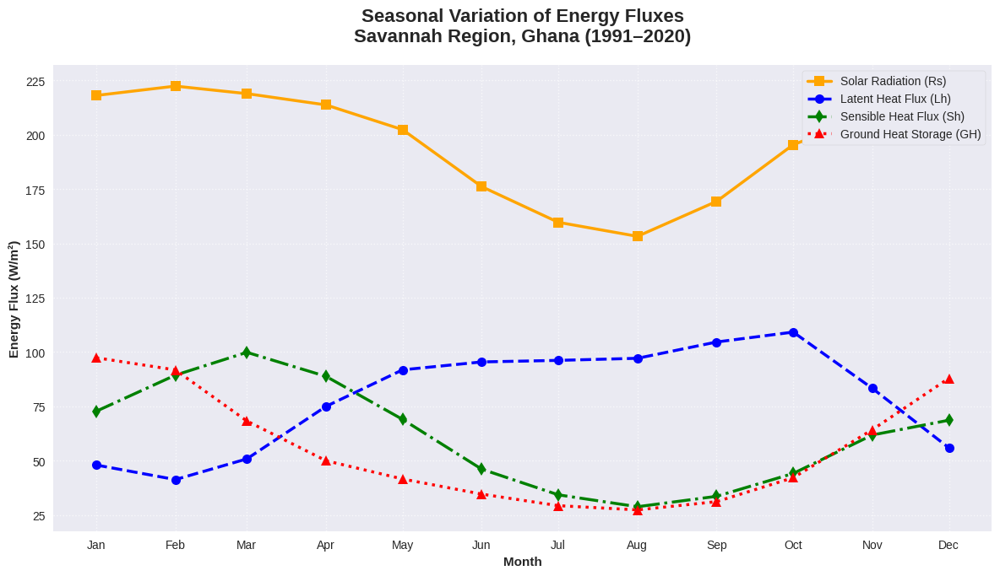

In [26]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from pathlib import Path

# Set up directories and check files
output_dir = Path("output_files")
required_files = ["rs_monthly.nc", "lh_monthly.nc", "sh_monthly.nc", "gh_monthly.nc"]
for file in required_files:
    if not (output_dir / file).exists():
        raise FileNotFoundError(f"Required data file not found: {output_dir/file}")

# Load and process data with error handling
try:
    rs_monthly = xr.open_dataset(output_dir/"rs_monthly.nc")["avg_snswrf"]
    lh_monthly = xr.open_dataset(output_dir/"lh_monthly.nc")["avg_slhtf"] * -1
    sh_monthly = xr.open_dataset(output_dir/"sh_monthly.nc")["avg_ishf"] * -1
    gh_monthly = xr.open_dataset(output_dir/"gh_monthly.nc")["GH"]
    
    # Calculate global means
    rs_monthly = rs_monthly.mean(dim=["lat", "lon"])
    lh_monthly = lh_monthly.mean(dim=["lat", "lon"])
    sh_monthly = sh_monthly.mean(dim=["lat", "lon"])
    gh_monthly = gh_monthly.mean(dim=["lat", "lon"])
    
except Exception as e:
    raise RuntimeError(f"Error processing data: {str(e)}")

# Create figure with professional styling
plt.style.use('seaborn-v0_8')  # Modern and clean style
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold'
})

fig, ax = plt.subplots(figsize=(12, 7))

# Create time axis
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")

# Plot each variable with enhanced styling
line_styles = {
    "Solar Radiation (Rs)": ('orange', 's', '-', 2.5),
    "Latent Heat Flux (Lh)": ('blue', 'o', '--', 2.5),
    "Sensible Heat Flux (Sh)": ('green', 'd', '-.', 2.5),
    "Ground Heat Storage (GH)": ('red', '^', ':', 2.5)
}

for label, (color, marker, linestyle, lw) in line_styles.items():
    data = {
        "Solar Radiation (Rs)": rs_monthly,
        "Latent Heat Flux (Lh)": lh_monthly,
        "Sensible Heat Flux (Sh)": sh_monthly,
        "Ground Heat Storage (GH)": gh_monthly
    }[label]
    ax.plot(months, data, label=label, color=color, marker=marker, 
            linestyle=linestyle, linewidth=lw, markersize=8, markeredgecolor='w')

# Format x-axis
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.set_xlabel("Month", fontweight='bold')

# Format y-axis
ax.set_ylabel("Energy Flux (W/m²)", fontweight='bold')
ax.grid(True, linestyle=':', alpha=0.7)

# Add title and legend
ax.set_title("Seasonal Variation of Energy Fluxes\nSavannah Region, Ghana (1991–2020)", 
             fontsize=16, pad=20, fontweight='bold')
ax.legend(frameon=True, framealpha=1, loc='upper right')

# Final adjustments and save
plt.tight_layout()
output_filename = "Seasonal_Variation_of_Energy_Fluxes_Savannah_Ghana.png"
try:
    plt.savefig(output_filename, dpi=300, bbox_inches="tight", facecolor='white')
    print(f"Successfully saved: {output_filename}")
except Exception as e:
    print(f"Error saving plot: {str(e)}")

plt.show()

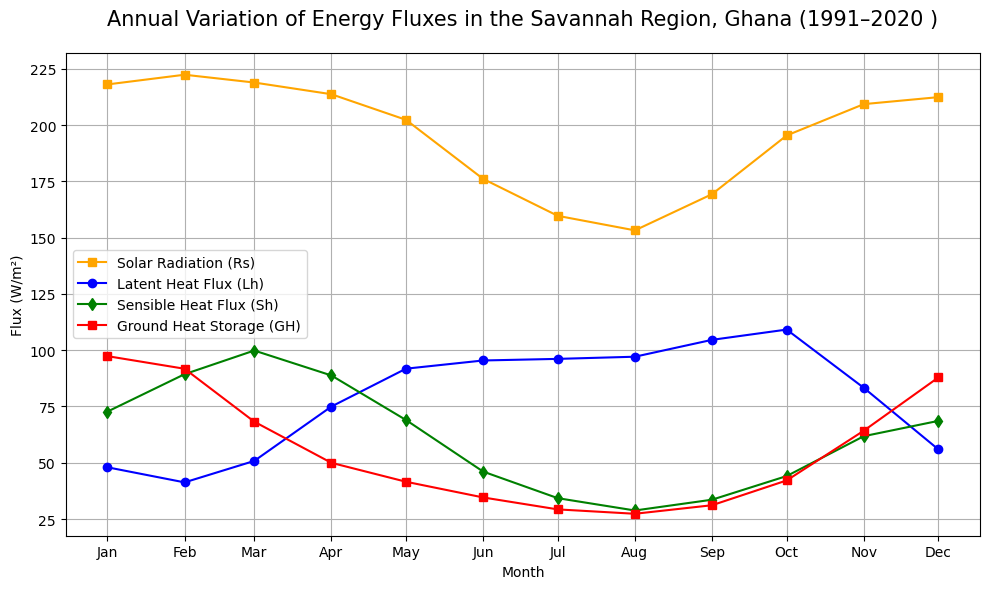

In [27]:


# Load the monthly mean data for each variable
rs_monthly = xr.open_dataset("output_files/rs_monthly.nc")["avg_snswrf"]
lh_monthly = xr.open_dataset("output_files/lh_monthly.nc")["avg_slhtf"] * -1
sh_monthly = xr.open_dataset("output_files/sh_monthly.nc")["avg_ishf"] * -1
gh_monthly = xr.open_dataset("output_files/gh_monthly.nc")["GH"]

# Ensures the data is 1D
rs_monthly = rs_monthly.mean(dim=["lat", "lon"])
lh_monthly = lh_monthly.mean(dim=["lat", "lon"])
sh_monthly = sh_monthly.mean(dim=["lat", "lon"])
gh_monthly = gh_monthly.mean(dim=["lat", "lon"])


# Create a time series plot
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")  # Dummy dates for plotting

plt.figure(figsize=(10, 6))

# Plot each variable
plt.plot(months, rs_monthly, label="Solar Radiation (Rs)", color="orange", marker="s")
plt.plot(months, lh_monthly, label="Latent Heat Flux (Lh)", color="blue", marker="o")
plt.plot(months, sh_monthly, label="Sensible Heat Flux (Sh)", color="green", marker="d")
plt.plot(months, gh_monthly, label="Ground Heat Storage (GH)", color="red", marker="s")

# Add labels, title, and legend
plt.xlabel("Month")
plt.ylabel("Flux (W/m²)")
plt.title("Annual Variation of Energy Fluxes in the Savannah Region, Ghana (1991–2020 )",fontsize=15, pad=20)
plt.xticks(months, ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.savefig("seasonal Variation of Energy Fluxes in the Savannah Region, Ghana.png", dpi=300, bbox_inches="tight")
plt.show()


<summary>
    <h3>Reasons for the Nature of the Plot:</h3>
    <details>
        <p>
            The study area experiences a unimodal rainfall pattern, with rainfall occurring primarily between May and October each year. Annual rainfall records range between 500 mm and 1200 mm [28]. Additionally, the mean monthly temperature in the region varies from 27&deg;C to 36&deg;C [19]. These climatic conditions influence the energy fluxes depicted in the plot.
        </p>
        <p>
            During the rainy season:
            <ul>
                <li>Solar radiation is expected to be lower than in the dry season due to increased cloud cover, which dims incoming solar radiation.</li>
                <li>Latent heat fluxes are expected to rise because of increased evaporation.</li>
                <li>Sensible heat flux is expected to be lower.</li>
                <li>Ground heat storage is expected to decrease during the rainy season and rise again when the rains cease and solar radiation begins to peak.</li>
            </ul>
        </p>
        <p>
            For further insight into the climatology of the area, refer to this research paper: 
            <a href="https://www.researchgate.net/publication/347156768_Rainfall_variabilities_and_droughts_in_the_Savannah_zone_of_Ghana_from_1960-2015" target="_blank">Rainfall Variabilities and Droughts in the Savannah Zone of Ghana from 1960-2015</a>.
        </p>
    </details>
</summary>

### Shell Script for Data Processing

This script processes climate data files to extract specific variables, calculate ground heat storage, and compute monthly means. The steps are as follows:

1. Extract data for a Asante Akim North District  in Ghana (longitude: -1.20° to -0.15°, latitude: 6.30° to 7.30°)
2. Calculate ground heat storage (GH = Rs - Lh - Sh).
3. Compute monthly means for each variable.
4. Calculate the field mean.

In [28]:
%%bash

# Input files for each variable
rs_file="Net_surface.nc"  # Solar Radiation (avg_snswrf)
lh_file="Net_latentheat.nc"  # Latent Heat Flux (avg_slhtf)
sh_file="Net_sensible.nc"  # Sensible Heat Flux (avg_ishf)

# Output directory for saving processed files
output_dir="Seasonal_Variation"
mkdir -p "$output_dir"

# Extract data for the Asante Akim North District (longitude: -1.20° to -0.15°, latitude: 6.30° to 7.30°)
south_rs="${output_dir}/south_rs.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$rs_file" "$south_rs"

south_lh="${output_dir}/south_lh.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$lh_file" "$south_lh"

south_sh="${output_dir}/south_sh.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$sh_file" "$south_sh"

# Calculate Ground Heat Storage (GH = Rs - Lh - Sh)
# Ensure variable names match those in your NetCDF files
south_gh="${output_dir}/south_gh.nc"
cdo expr,'GH=avg_snswrf-(avg_slhtf*-1)-(avg_ishf*-1)' -merge "$south_rs" "$south_lh" "$south_sh" "$south_gh"

# Calculate monthly means for each variable
rs_monthly="${output_dir}/rs_monthly.nc"
cdo ymonmean "$south_rs" "$rs_monthly"

lh_monthly="${output_dir}/lh_monthly.nc"
cdo ymonmean "$south_lh" "$lh_monthly"

sh_monthly="${output_dir}/sh_monthly.nc"
cdo ymonmean "$south_sh" "$sh_monthly"

gh_monthly="${output_dir}/gh_monthly.nc"
cdo ymonmean "$south_gh" "$gh_monthly"

# Calculate spatial means
rs_mean="${output_dir}/rs_mean.nc"
cdo fldmean "$rs_monthly" "$rs_mean"

lh_mean="${output_dir}/lh_mean.nc"
cdo fldmean "$lh_monthly" "$lh_mean"

sh_mean="${output_dir}/sh_mean.nc"
cdo fldmean "$sh_monthly" "$sh_mean"

gh_mean="${output_dir}/gh_mean.nc"
cdo fldmean "$gh_monthly" "$gh_mean"


echo "Data processing complete. Output files saved in: $output_dir"

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Data processing complete. Output files saved in: Seasonal_Variation


### Used squeeze() to remove other dimesions (lat, lon) to ensure the data is 1D 

In [5]:

# Load the monthly mean data for each variable
rs_m= xr.open_dataset("Seasonal_Variation/rs_mean.nc")["avg_snswrf"].squeeze()
lh_m = xr.open_dataset("Seasonal_Variation/lh_mean.nc")["avg_slhtf"].squeeze() * -1
sh_m = xr.open_dataset("Seasonal_Variation/sh_mean.nc")["avg_ishf"].squeeze() * -1
gh_m = xr.open_dataset("Seasonal_Variation/gh_mean.nc")["GH"].squeeze()

cdo sub asr_zonal.nc olr_zonal.nc net_radiation_imbalance.nc# Create a time series plot
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")  # Dummy dates for plotting

plt.figure(figsize=(10, 6))

# Plot each variable
plt.plot(months, rs_m, label="Solar Radiation (Rs)", color="orange", marker="o")
plt.plot(months, lh_m, label="Latent Heat Flux (Lh)", color="blue", marker="o")
plt.plot(months, sh_m, label="Sensible Heat Flux (Sh)", color="green", marker="o")
plt.plot(months, gh_m, label="Ground Heat Storage (GH)", color="red", marker="o")

# Add labels, title, and legend
plt.xlabel("Month")
plt.ylabel("Flux (W/m²)")
plt.title("Annual Variation of Energy Fluxes in the Asante Akim  District, Ghana (1991–2020 )", fontsize=15, pad=20)
plt.xticks(months, ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
#plt.savefig("Seasonal_Variation_of_Energy_Fluxes_in_the_Asante_Akim_Ghana.png", dpi=300, bbox_inches="tight")
plt.show()


SyntaxError: invalid syntax (4288460999.py, line 7)

### Another way is to use the monthly mean data and averaged it again to get 1D spatial mean

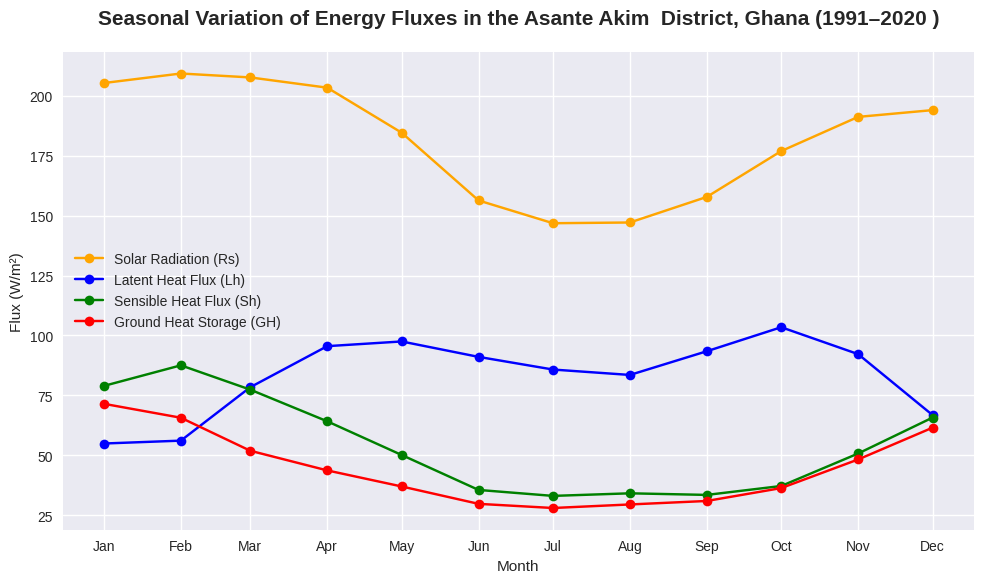

In [25]:


# Load the monthly mean data for each variable
rs_monthly = xr.open_dataset("Seasonal_Variation/rs_monthly.nc")["avg_snswrf"]
lh_monthly = xr.open_dataset("Seasonal_Variation/lh_monthly.nc")["avg_slhtf"] * -1
sh_monthly = xr.open_dataset("Seasonal_Variation/sh_monthly.nc")["avg_ishf"] * -1
gh_monthly = xr.open_dataset("Seasonal_Variation/gh_monthly.nc")["GH"]

# Ensure the data is 1D (12 values)
rs_monthly = rs_monthly.mean(dim=["latitude", "longitude"])
lh_monthly = lh_monthly.mean(dim=["latitude", "longitude"])
sh_monthly = sh_monthly.mean(dim=["latitude", "longitude"])
gh_monthly = gh_monthly.mean(dim=["latitude", "longitude"])

# Create a time series plot
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")  # Dummy dates for plotting

plt.figure(figsize=(10, 6))

# Plot each variable
plt.plot(months, rs_monthly, label="Solar Radiation (Rs)", color="orange", marker="o")
plt.plot(months, lh_monthly, label="Latent Heat Flux (Lh)", color="blue", marker="o")
plt.plot(months, sh_monthly, label="Sensible Heat Flux (Sh)", color="green", marker="o")
plt.plot(months, gh_monthly, label="Ground Heat Storage (GH)", color="red", marker="o")

# Add labels, title, and legend
plt.xlabel("Month")
plt.ylabel("Flux (W/m²)")
plt.title("Seasonal Variation of Energy Fluxes in the Asante Akim  District, Ghana (1991–2020 )", fontsize=15, pad=20)
plt.xticks(months, ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.savefig("Seasonal_Variation_of_Energy_Fluxes_in_the_Asante_Akim_Ghana.png", dpi=300, bbox_inches="tight")
plt.show()

### Reasons for the Nature of the Plot:

- **Solar Radiation (Rs):** Solar radiation is high during the dry season (December to March) due to clear skies and minimal cloud cover. It decreases during the rainy seasons as cloud cover increases, reducing the amount of solar energy reaching the surface.

- **Latent Heat Flux (Lh):** Latent heat flux rises during the rainy seasons (May to July and September to November) due to increased evaporation from the surface. This is driven by higher moisture availability and vegetation activity during these periods.

- **Sensible Heat Flux (Sh):** Sensible heat flux peaks during the dry season when surface heating is maximized. During the rainy seasons, more energy is diverted to latent heat flux (evaporation), reducing sensible heat flux.

- **Ground Heat Storage (GH):** Ground heat storage varies seasonally, influenced by the balance between incoming solar radiation and outgoing heat fluxes (latent and sensible). It typically follows the trend of solar radiation but with some lag due to the thermal inertia of the ground.

The study area experiences two rainy seasons:
1. **First Rainy Season:** May to July
2. **Second Rainy Season:** September to November

Temperatures remain uniformly high throughout the year, with a mean annual temperature of 26 ;C .

For further insight into the climatology of the area, refer to this research paper, specifically the **Materials and Methods** section in Chapter 2:  
[Link to the paper](https://www.sciencedirect.com/science/article/pii/S2666049023000154).

<div class="alert alert-block alert-info">

# **Annual cycle of the terrestrial water balance for my subdomains**

</div>

In [3]:
%%bash

# Input files
precip_file="Total_precip.nc"      # Precipitation (avg_trprate)
pet_file="Evapotrans.nc"           # Potential Evapotranspiration (avg_perv)
evap_file="Net_evaporation.nc"     # Evaporation (avg_ie)
temp_file="Temperature.nc"         # Temperature (t2m) in Kelvin

# Output directory
outfile="Seasonal_Variation_Savannah"
mkdir -p "$outfile"

# Extract data for the Savannah Region (longitude: -2.82° to 0.45°, latitude: 7.30° to 11.30°)
south_precip="${outfile}/south_precip.nc"
cdo -sellonlatbox,-2.82,0.45,7.30,11.30 "$precip_file" "$south_precip"

south_pet="${outfile}/south_pet.nc"
cdo -sellonlatbox,-2.82,0.45,7.30,11.30 "$pet_file" "$south_pet"

south_evap="${outfile}/south_evap.nc"
cdo -sellonlatbox,-2.82,0.45,7.30,11.30 "$evap_file" "$south_evap"

south_temp="${outfile}/south_temp.nc"
cdo -sellonlatbox,-2.82,0.45,7.30,11.30 "$temp_file" "$south_temp"

# Calculate monthly means (ymonmean)
precip_monthly="${outfile}/precip_monthly.nc"
cdo ymonmean "$south_precip" "$precip_monthly"

pet_monthly="${outfile}/pet_monthly.nc"
cdo ymonmean "$south_pet" "$pet_monthly"

evap_monthly="${outfile}/evap_monthly.nc"
cdo ymonmean "$south_evap" "$evap_monthly"

temp_monthly="${outfile}/temp_monthly.nc"
cdo ymonmean "$south_temp" "$temp_monthly"

# Calculate spatial means (fldmean)
precip_mean="${outfile}/precip_mean.nc"
cdo fldmean "$precip_monthly" "$precip_mean"

pet_mean="${outfile}/pet_mean.nc"
cdo fldmean "$pet_monthly" "$pet_mean"

evap_mean="${outfile}/evap_mean.nc"
cdo fldmean "$evap_monthly" "$evap_mean"

temp_mean="${outfile}/temp_mean.nc"
cdo fldmean "$temp_monthly" "$temp_mean"

# Convert units (kg m⁻² s⁻¹ → mm/day) (factor: 86400)
precip_mmday="${outfile}/precip_mmday.nc"
cdo mulc,86400 "$precip_mean" "$precip_mmday"

pet_mmday="${outfile}/pet_mmday.nc"
cdo mulc,86400 "$pet_mean" "$pet_mmday"

evap_mmday="${outfile}/evap_mmday.nc"
cdo mulc,86400 "$evap_mean" "$evap_mmday"

# Convert temperature from Kelvin to Celsius (optional)
temp_celsius="${outfile}/temp_celsius.nc"
cdo subc,273.15 "$temp_mean" "$temp_celsius"

echo "Data processing complete. Output files saved in: $outfile"

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Data processing complete. Output files saved in: Seasonal_Variation_Savannah


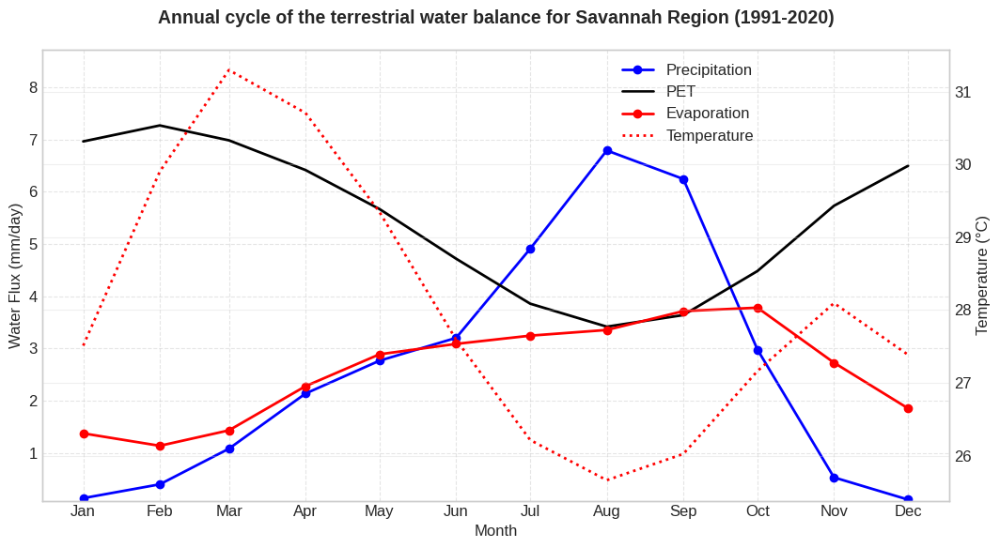

In [6]:
# Load  data
precip = xr.open_dataset("Seasonal_Variation_Savannah/precip_mmday.nc")
pet = xr.open_dataset("Seasonal_Variation_Savannah/pet_mmday.nc")
evap = xr.open_dataset("Seasonal_Variation_Savannah/evap_mmday.nc")
temp = xr.open_dataset("Seasonal_Variation_Savannah/temp_celsius.nc")

# Extract the time series values
precip_vals = precip["avg_tprate"].values.flatten()
pet_vals = pet["avg_pevr"].values.flatten() * -1
evap_vals = evap["avg_ie"].values.flatten() *-1
temp_vals = temp["t2m"].values.flatten()

# Create the time axis (12 months)
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot all water fluxes on primary axis
line1, = ax1.plot(months, precip_vals, label="Precipitation", 
                 color="blue", marker="o", linewidth=2)
line2, = ax1.plot(months, pet_vals, label="PET", 
                 color="black", linestyle="-", linewidth=2)
line3, = ax1.plot(months, evap_vals, label="Evaporation", 
                 color="red", marker="o", linewidth=2)

# Set y-axis limits for water fluxes (adjust if needed)
water_min = min(min(precip_vals), min(pet_vals), min(evap_vals))
water_max = max(max(precip_vals), max(pet_vals), max(evap_vals))
ax1.set_ylim(water_min - 0.2*abs(water_min), water_max * 1.2)  # 10% padding

# Configure primary axis
ax1.set_xlabel("Month", fontsize=12)
ax1.set_ylabel("Water Flux (mm/day)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.5)

# Create secondary axis for temperature
ax2 = ax1.twinx()
line4, = ax2.plot(months, temp_vals, label="Temperature", 
                 color="red", linestyle=":", linewidth=2)
ax2.set_ylabel("Temperature (°C)", fontsize=12)

# Add title and customize ticks
plt.title("Annual cycle of the terrestrial water balance for Savannah Region (1991-2020)", 
         fontsize=14, pad=20, weight='bold')
ax1.set_xticks(months)
ax1.set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                    "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

# Combine legends from both axes
lines = [line1, line2, line3, line4]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc="best", 
          bbox_to_anchor=(0.8, 1), framealpha=1)

# Adjust layout to make room for legend
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Make space on right side

# Save and show
plt.savefig("Seasonal_Variation_Savannah/seasonal_fluxes_temp.png", 
           dpi=300, bbox_inches="tight")
plt.show()

In [31]:
%%bash

# Input files
precip_file="Total_precip.nc"      # Precipitation (avg_trprate)
pet_file="Evapotrans.nc"           # Potential Evapotranspiration (avg_perv)
evap_file="Net_evaporation.nc"     # Evaporation (avg_ie)
temp_file="Temperature.nc"         # Temperature (t2m) in Kelvin

# Output directory
outfile="Seasonal_Variation"
mkdir -p "$outfile"

# Extract data for the Asante Akim North (longitude: -1.20° to -0.15°, latitude: 6.30° to 7.30°)
south_precip="${outfile}/south_precip.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$precip_file" "$south_precip"

south_pet="${outfile}/south_pet.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$pet_file" "$south_pet"

south_evap="${outfile}/south_evap.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$evap_file" "$south_evap"

south_temp="${outfile}/south_temp.nc"
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 "$temp_file" "$south_temp"

# Calculate monthly means (ymonmean)
precip_monthly="${outfile}/precip_monthly.nc"
cdo ymonmean "$south_precip" "$precip_monthly"

pet_monthly="${outfile}/pet_monthly.nc"
cdo ymonmean "$south_pet" "$pet_monthly"

evap_monthly="${outfile}/evap_monthly.nc"
cdo ymonmean "$south_evap" "$evap_monthly"

temp_monthly="${outfile}/temp_monthly.nc"
cdo ymonmean "$south_temp" "$temp_monthly"

# Calculate spatial means (fldmean)
precip_mean="${outfile}/precip_mean.nc"
cdo fldmean "$precip_monthly" "$precip_mean"

pet_mean="${outfile}/pet_mean.nc"
cdo fldmean "$pet_monthly" "$pet_mean"

evap_mean="${outfile}/evap_mean.nc"
cdo fldmean "$evap_monthly" "$evap_mean"

temp_mean="${outfile}/temp_mean.nc"
cdo fldmean "$temp_monthly" "$temp_mean"

# Convert units (kg m⁻² s⁻¹ → mm/day) (factor: 86400)
precip_mmday="${outfile}/precip_mmday.nc"
cdo mulc,86400 "$precip_mean" "$precip_mmday"

pet_mmday="${outfile}/pet_mmday.nc"
cdo mulc,86400 "$pet_mean" "$pet_mmday"

evap_mmday="${outfile}/evap_mmday.nc"
cdo mulc,86400 "$evap_mean" "$evap_mmday"

# Convert temperature from Kelvin to Celsius (optional)
temp_celsius="${outfile}/temp_celsius.nc"
cdo subc,273.15 "$temp_mean" "$temp_celsius"

echo "Data processing complete. Output files saved in: $outfile"

cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Data processing complete. Output files saved in: Seasonal_Variation


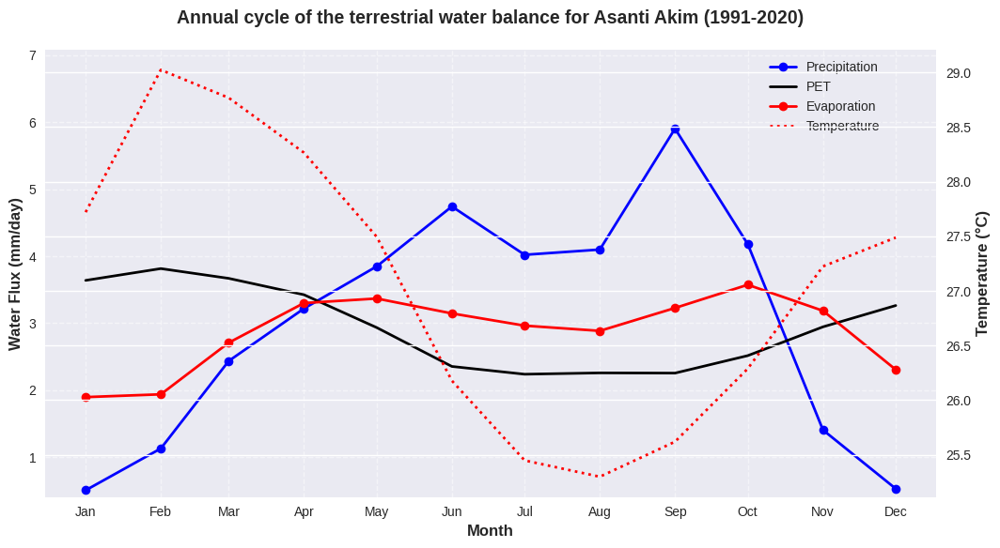

In [27]:
# Load  data
precip = xr.open_dataset("Seasonal_Variation/precip_mmday.nc")
pet = xr.open_dataset("Seasonal_Variation/pet_mmday.nc")
evap = xr.open_dataset("Seasonal_Variation/evap_mmday.nc")
temp = xr.open_dataset("Seasonal_Variation/temp_celsius.nc")

# Extract the time series values
precip_vals = precip["avg_tprate"].values.flatten()
pet_vals = pet["avg_pevr"].values.flatten() * -1
evap_vals = evap["avg_ie"].values.flatten() *-1
temp_vals = temp["t2m"].values.flatten()

# Create the time axis (12 months)
months = pd.date_range(start="2023-01-01", periods=12, freq="MS")

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot all water fluxes on primary axis
line1, = ax1.plot(months, precip_vals, label="Precipitation", 
                 color="blue", marker="o", linewidth=2)
line2, = ax1.plot(months, pet_vals, label="PET", 
                 color="black", linestyle="-", linewidth=2)
line3, = ax1.plot(months, evap_vals, label="Evaporation", 
                 color="red", marker="o", linewidth=2)

# Set y-axis limits for water fluxes (adjust if needed)
water_min = min(min(precip_vals), min(pet_vals), min(evap_vals))
water_max = max(max(precip_vals), max(pet_vals), max(evap_vals))
ax1.set_ylim(water_min - 0.2*abs(water_min), water_max * 1.2)  # 10% padding

# Configure primary axis
ax1.set_xlabel("Month", fontsize=12)
ax1.set_ylabel("Water Flux (mm/day)", fontsize=12)
ax1.grid(True, linestyle='--', alpha=0.5)

# Create secondary axis for temperature
ax2 = ax1.twinx()
line4, = ax2.plot(months, temp_vals, label="Temperature", 
                 color="red", linestyle=":", linewidth=2)
ax2.set_ylabel("Temperature (°C)", fontsize=12)

# Add title and customize ticks
plt.title("Annual cycle of the terrestrial water balance for Asanti Akim (1991-2020)", 
         fontsize=14, pad=20, weight='bold')
ax1.set_xticks(months)
ax1.set_xticklabels(["Jan", "Feb", "Mar", "Apr", "May", "Jun",
                    "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])

# Combine legends from both axes
lines = [line1, line2, line3, line4]
labels = [line.get_label() for line in lines]
ax1.legend(lines, labels, loc="best", 
          bbox_to_anchor=(0.8, 1), framealpha=1)

# Adjust layout to make room for legend
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Make space on right side

# Save and show
plt.savefig("Seasonal_Variation/seasonal_fluxes_temp.png", 
           dpi=300, bbox_inches="tight")
plt.show()

### Diurnal Cycle

In [ ]:

groundwater = 12.3  # 10^6 km³
soil_moisture = 0.17  # 10^6 km³
total_volume = groundwater + soil_moisture  # 10^6 km³

# Convert to km³
total_volume_km3 = total_volume * 1e6  # km³

# Values  (in 10^3 km³/year)
precipitation_over_land = 107 * 1e3  # km³/year
runoff = 48 * 1e3  # km³/year
runoff_10_percent = 0.1 * runoff  # km³/year

#  Time for precipitation to replace groundwater and soil moisture
time_precipitation = total_volume_km3 / precipitation_over_land  # years

#  Time for 10% of runoff to replace groundwater and soil moisture
time_runoff_10_percent = total_volume_km3 / runoff_10_percent  # years

# Print results
print(f"Total volume of groundwater and soil moisture: {total_volume:.2f} x 10^6 km³")
print(f"Annual precipitation over land: {precipitation_over_land:.0f} km³/year")
print(f"Time for precipitation to replace groundwater and soil moisture: {time_precipitation:.2f} years")
print(f"Annual 10% runoff: {runoff_10_percent:.0f} km³/year")
print(f"Time for 10% runoff to replace groundwater and soil moisture: {time_runoff_10_percent:.2f} years")

In [1]:
%%bash
# Input files
PRECIP_FILE="hourly_precip.nc"    # Precipitation (avg_tprate)
PET_FILE="hourly_PET.nc"          # Potential ET (avg_perv) 
EVAP_FILE="hourly_evapo.nc"       # Evaporation (avg_ie)
TEMP_FILE="ttt.nc"                # Temperature (t2m)

# Output directory
OUTPUT_DIR="diurnal_results"
mkdir -p "$OUTPUT_DIR"

#  write permissions
chmod -R 755 "$OUTPUT_DIR"

# Conversion factor (kg m-2 s^-1 → mm/hour)
CONV_FACTOR=3600  # 60 sec/min * 60 min/hour 

echo "Converting units and calculating diurnal cycles..."

# Process precipitation, PET, and evaporation
for var in PRECIP PET EVAP; do
    infile="${var}_FILE"
    outname=$(echo "${var}" | tr '[:upper:]' '[:lower:]')
    
    if [ "$var" == "PET" ] || [ "$var" == "EVAP" ]; then
        # Convert to positive values and apply conversion factor
        cdo -abs "${!infile}" "$OUTPUT_DIR/${outname}_abs.nc"
        cdo -setrtoc,-inf,0,0 -mulc,$CONV_FACTOR "$OUTPUT_DIR/${outname}_abs.nc" "$OUTPUT_DIR/${outname}_mmhr.nc"
        rm "$OUTPUT_DIR/${outname}_abs.nc"
    else
        # Apply conversion factor directly for precipitation
        cdo -mulc,$CONV_FACTOR "${!infile}" "$OUTPUT_DIR/${outname}_mmhr.nc"
    fi
done

# Convert temperature from Kelvin to Celsius
cdo -subc,273.15 "$TEMP_FILE" "$OUTPUT_DIR/temp_C.nc"

# Calculate diurnal cycles
echo "Calculating hourly patterns..."
for var in precip pet evap temp; do
    if [ "$var" == "temp" ]; then
        input="$OUTPUT_DIR/temp_C.nc"
    else
        input="$OUTPUT_DIR/${var}_mmhr.nc"
    fi
    
    # Calculate hourly means across all days
    cdo -dhourmean "$input" "$OUTPUT_DIR/${var}_diurnal.nc"
    
    # Calculate spatial mean (fldmean) to reduce data to a single timeseries
    cdo -fldmean "$OUTPUT_DIR/${var}_diurnal.nc" "$OUTPUT_DIR/${var}_mean.nc"
done

echo "Analysis complete! Results in $OUTPUT_DIR/"
echo "Created files:"
ls -lh "$OUTPUT_DIR"/*{diurnal,mean}.nc

Converting units and calculating diurnal cycles...


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Calculating hourly patterns...
Analysis complete! Results in diurnal_results/
Created files:
-rw-rw-r-- 1 patrick-k-inkoom patrick-k-inkoom 35K Apr  2 09:13 diurnal_results/evap_diurnal.nc
rw-r-- 1 patrick-k-inkoom patrick-k-inkoom 34K Apr  2 09:13 diurnal_results/evap_mean.nc
1 patrick-k-inkoom patrick-k-inkoom 35K Apr  2 09:13 diurnal_results/pet_diurnal.nc
rick-k-inkoom patrick-k-inkoom 34K Apr  2 09:13 diurnal_results/pet_mean.nc
nkoom patrick-k-inkoom 35K Apr  2 09:13 diurnal_results/precip_diurnal.nc
oom patrick-k-inkoom 34K Apr  2 09:13 diurnal_results/precip_mean.nc
atrick-k-inkoom 35K Apr  2 09:13 diurnal_results/temp_diurnal.nc
ck-k-inkoom 34K Apr  2 09:13 diurnal_results/temp_mean.nc


In [ ]:
temp

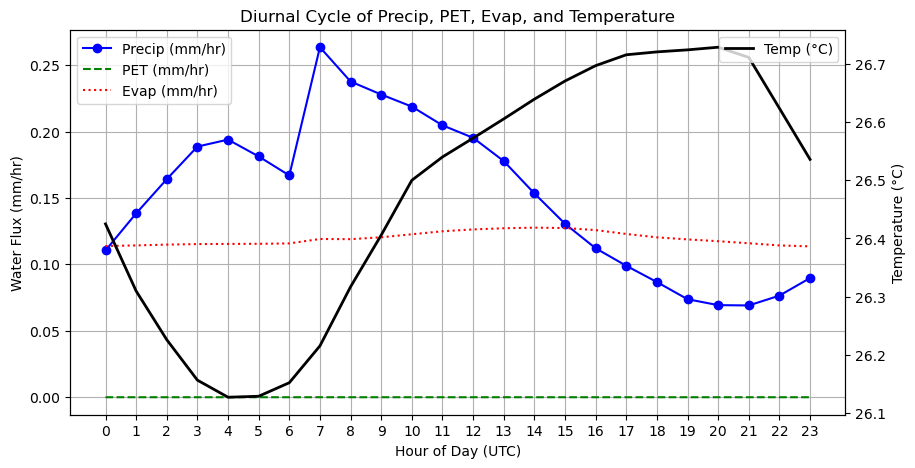

In [4]:


# Load processed NetCDF files
output_dir = "diurnal_results"

# Load datasets with correct variable names
precip = xr.open_dataset(f"{output_dir}/precip_mean.nc")["avg_tprate"].squeeze()
pet = xr.open_dataset(f"{output_dir}/pet_mean.nc")["avg_pevr"].squeeze()
evap = xr.open_dataset(f"{output_dir}/evap_mean.nc")["avg_ie"].squeeze()
temp = xr.open_dataset(f"{output_dir}/temp_mean.nc")["t2m"].squeeze()

# Use "valid_time" instead of "time"
if "valid_time" in precip.coords:
    time = precip.coords["valid_time"].dt.hour
else:
    raise ValueError("Time coordinate 'valid_time' missing from dataset. Check NetCDF file.")

# Create plot
fig, ax1 = plt.subplots(figsize=(10, 5))

# Left y-axis for water fluxes
ax1.plot(time, precip, label="Precip (mm/hr)", color="b", marker="o")
ax1.plot(time, pet, label="PET (mm/hr)", color="g", linestyle="--")
ax1.plot(time, evap, label="Evap (mm/hr)", color="r", linestyle=":")

ax1.set_xlabel("Hour of Day (UTC)")
ax1.set_ylabel("Water Flux (mm/hr)")
ax1.set_xticks(range(0, 24,))
ax1.set_title("Diurnal Cycle of Precip, PET, Evap, and Temperature")
ax1.legend(loc="upper left")
ax1.grid(True)

# Right y-axis for temperature
ax2 = ax1.twinx()
ax2.plot(time, temp, label="Temp (°C)", color="k", linewidth=2)
ax2.set_ylabel("Temperature (°C)")
ax2.legend(loc="upper right")

# Show plot
plt.show()


### Modelled Output

In [41]:
Access_CM2 = xr.open_dataset("Simp/pr_Amon_ACCESS-CM2.nc")
Access_CM2

<xarray.Dataset> Size: 219MB
Dimensions:    (time: 1980, bnds: 2, lat: 144, lon: 192)
Coordinates:
  * time       (time) datetime64[ns] 16kB 1850-01-16T12:00:00 ... 2014-12-16T...
  * lat        (lat) float64 1kB -89.38 -88.12 -86.88 ... 86.88 88.12 89.38
  * lon        (lon) float64 2kB 0.9375 2.812 4.688 6.562 ... 355.3 357.2 359.1
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 32kB ...
    lat_bnds   (lat, bnds) float64 2kB ...
    lon_bnds   (lon, bnds) float64 3kB ...
    pr         (time, lat, lon) float32 219MB ...
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  0.0
    creation_date:          2019-11-08T08:26:37Z
    ...                     ...
    variable_id:            pr
    variant_label:          r1i1p1f1
    version:                v20191108
    cmor_version:           3.4.0
    tracking_id:            hdl:21.14100/b4dd0f13-6073-4d10-b4e6-7d7a4401e37d
    license:                CMIP6 model data produced by CSIRO is licensed un...

In [42]:
Access_ESM = xr.open_dataset("Simp/pr_Amon_ACCESS-ESM1-5.nc")
Access_ESM

<xarray.Dataset> Size: 221MB
Dimensions:    (time: 1980, bnds: 2, lat: 145, lon: 192)
Coordinates:
  * time       (time) datetime64[ns] 16kB 1850-01-16T12:00:00 ... 2014-12-16T...
  * lat        (lat) float64 1kB -90.0 -88.75 -87.5 -86.25 ... 87.5 88.75 90.0
  * lon        (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 354.4 356.2 358.1
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 32kB ...
    lat_bnds   (lat, bnds) float64 2kB ...
    lon_bnds   (lon, bnds) float64 3kB ...
    pr         (time, lat, lon) float32 220MB ...
Attributes: (12/47)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   0.0
    branch_time_in_parent:  21915.0
    creation_date:          2019-11-15T04:32:57Z
    ...                     ...
    variable_id:            pr
    variant_label:          r1i1p1f1
    version:                v20191115
    cmor_version:           3.4.0
    tracking_id:            hdl:21.14100/e1bc1d0d-54d8-4a7f-adae-d3f6324a2366
    license:                CMIP6 model data produced by CSIRO is licensed un...

In [9]:
%%bash

# Create output directories

mkdir -p modelss

# Define input and output directories
INPUT_DIR="Simp"
OUTPUT_DIR="modelss"

# Define ERA5 resolution
ERA5_RES="r1440x721"

# First process all data to common format before subdomain extraction
echo "Processing precipitation data..."
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-CM2.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_remap.nc
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-ESM1-5.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap.nc

echo "Processing temperature data..."
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-CM2_historical.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_remap.nc
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-ESM1-5_historical.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap.nc

# Process precipitation data 
echo "Converting precipitation to mm/day..."
cdo -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-CM2_remap.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday.nc
cdo -setrtoc,-inf,0,0 -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday.nc
cdo -mulc,86400 ${INPUT_DIR}/total_precip.nc ${OUTPUT_DIR}/obs_pr_mmday.nc

# Process temperature data
echo "Converting temperature to Celsius..."
cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-CM2_remap.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_C.nc
cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C.nc
cdo -subc,273.15 ${INPUT_DIR}/2m_temp.nc ${OUTPUT_DIR}/obs_tas_C.nc

# Fix latitude orientation in observations
echo "Fixing latitude orientation..."
cdo invertlat ${OUTPUT_DIR}/obs_pr_mmday.nc ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc
cdo invertlat ${OUTPUT_DIR}/obs_tas_C.nc ${OUTPUT_DIR}/obs_tas_C_fixed.nc

# Extract subdomain
echo "Extracting subdomain..."
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/obs_tas_C_fixed.nc ${OUTPUT_DIR}/obs_tas_C_sub.nc
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc ${OUTPUT_DIR}/obs_pr_mmday_sub.nc
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/tas_ACCESS-CM2_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_sub.nc
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_sub.nc
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_sub.nc
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_sub.nc

# Select time period 1981-2010 for subdomain files
echo "Selecting time period 1981-2010..."
cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_sub.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_subdomain.nc
cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_sub.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_subdomain.nc
cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_sub.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_subdomain.nc
cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-CM2_sub.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_subdomain.nc

# Calculate climatologies and metrics using subdomain files
echo "Calculating monthly climatologies..."
cdo -ymonmean ${OUTPUT_DIR}/tas_ACCESS-CM2_subdomain.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_ym.nc
cdo -ymonmean ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_subdomain.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_ym.nc
cdo -ymonmean ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_subdomain.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_ym.nc
cdo -ymonmean ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_subdomain.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_ym.nc
cdo -ymonmean ${OUTPUT_DIR}/obs_pr_mmday_sub.nc ${OUTPUT_DIR}/obs_pr_ym.nc
cdo -ymonmean ${OUTPUT_DIR}/obs_tas_C_sub.nc ${OUTPUT_DIR}/obs_tas_ym.nc

# First remap observations to model grid for correlation calculation
echo "Remapping observations to model grid..."
cdo -remapbil,${OUTPUT_DIR}/tas_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_tas_ym.nc ${OUTPUT_DIR}/obs_tas_remap_CM2.nc
cdo -remapbil,${OUTPUT_DIR}/tas_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_tas_ym.nc ${OUTPUT_DIR}/obs_tas_remap_ESM1-5.nc
cdo -remapbil,${OUTPUT_DIR}/pr_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_pr_ym.nc ${OUTPUT_DIR}/obs_pr_remap_CM2.nc
cdo -remapbil,${OUTPUT_DIR}/pr_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_pr_ym.nc ${OUTPUT_DIR}/obs_pr_remap_ESM1-5.nc

# Calculate spatial correlations
echo "Calculating spatial correlations..."
cdo -fldcor ${OUTPUT_DIR}/tas_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_tas_remap_CM2.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_corr.nc
cdo -fldcor ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_tas_remap_ESM1-5.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_corr.nc
cdo -fldcor ${OUTPUT_DIR}/pr_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_pr_remap_CM2.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_corr.nc
cdo -fldcor ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_pr_remap_ESM1-5.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_corr.nc

# Calculate biases
echo "Calculating biases..."
cdo -sub ${OUTPUT_DIR}/tas_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_tas_remap_CM2.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_bias.nc
cdo -sub ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_tas_remap_ESM1-5.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_bias.nc
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-CM2_ym.nc ${OUTPUT_DIR}/obs_pr_remap_CM2.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_bias.nc
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_ym.nc ${OUTPUT_DIR}/obs_pr_remap_ESM1-5.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_bias.nc

echo "Processing complete. Output files are in ${OUTPUT_DIR}/ directory."

Processing precipitation data...
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid
Processing temperature data...
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid
Converting precipitation to mm/day...


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Converting temperature to Celsius...


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Fixing latitude orientation...
Extracting subdomain...
Selecting time period 1981-2010...
Calculating monthly climatologies...
Remapping observations to model grid...
cdo    remapbil: Bilinear weights from lonlat (4x4) to lonlat (4x4) grid
cdo    remapbil: Bilinear weights from lonlat (4x4) to lonlat (4x4) grid
cdo    remapbil: Bilinear weights from lonlat (4x4) to lonlat (4x4) grid
cdo    remapbil: Bilinear weights from lonlat (4x4) to lonlat (4x4) grid
Calculating spatial correlations...


cdo    fldcor (Warning): Input parameters have different levels!
cdo    fldcor (Warning): Input parameters have different levels!


Calculating biases...


cdo    sub (Warning): Input parameters have different levels!
cdo    sub (Warning): Input parameters have different levels!


Processing complete. Output files are in modelss/ directory.



Processing precipitation...


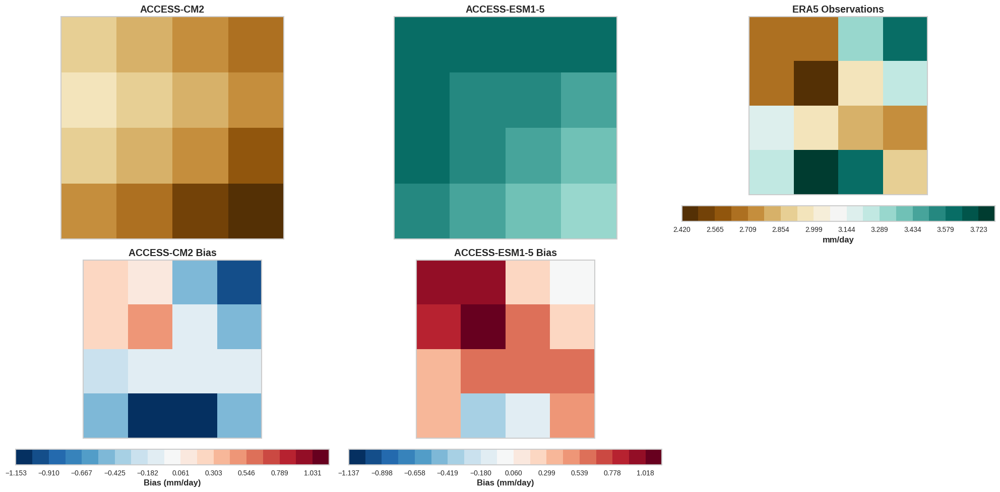

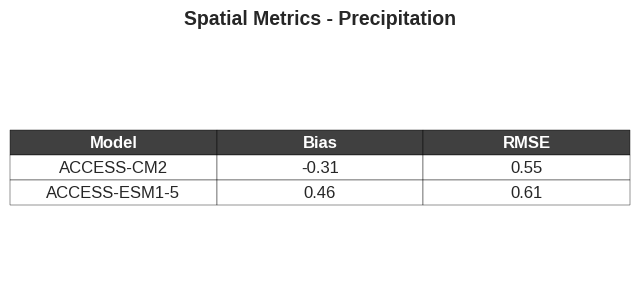


Precipitation Metrics:
ACCESS-CM2:
  Bias: -0.31
  RMSE: 0.55

ACCESS-ESM1-5:
  Bias: 0.46
  RMSE: 0.61


Processing temperature...


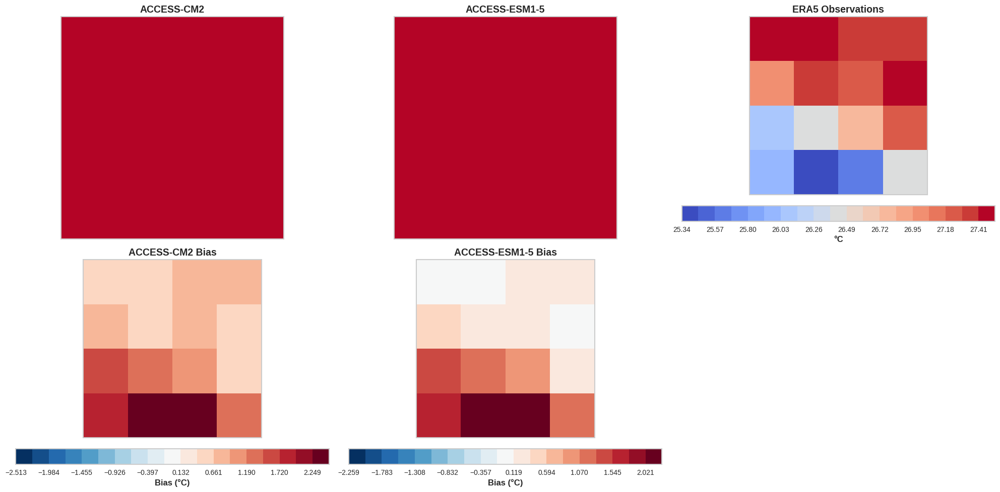

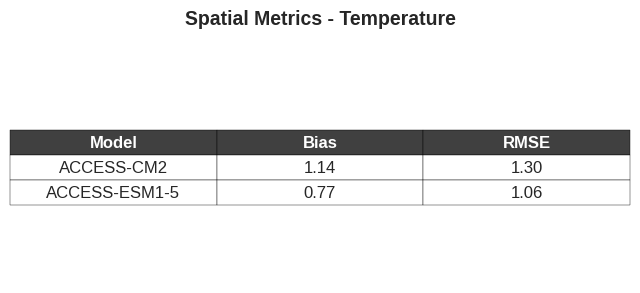


Temperature Metrics:
ACCESS-CM2:
  Bias: 1.14
  RMSE: 1.30

ACCESS-ESM1-5:
  Bias: 0.77
  RMSE: 1.06



In [70]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
import os

# Set paths
output_dir = "modelss"
plot_dir = "plots"
os.makedirs(plot_dir, exist_ok=True)

# Custom plot settings
plt.rcParams.update({
    'font.size': 12,
    'figure.facecolor': 'white',
    'axes.grid': False,
})

# Colormaps and normalization
PRECIP_CMAP = 'BrBG'
TEMP_CMAP = 'coolwarm'
BIAS_CMAP = 'RdBu_r'

# Variable names in observation files
OBS_VAR_NAMES = {
    'precipitation': 'avg_tprate',
    'temperature': 't2m'
}

def prepare_spatial_data(da):
    """Prepare spatial data by averaging over non-spatial dimensions"""
    # Remove any singleton dimensions
    da = da.squeeze()
    
    # Check if dimensions are already 'lat' and 'lon'
    if 'lat' in da.dims and 'lon' in da.dims:
        pass
    # Check if dimensions are 'latitude' and 'longitude' and rename them
    elif 'latitude' in da.dims and 'longitude' in da.dims:
        da = da.rename({'latitude': 'lat', 'longitude': 'lon'})
    else:
        raise ValueError(f"DataArray must contain 'lat' and 'lon' or 'latitude' and 'longitude' dimensions. Current dimensions: {da.dims}")
    
    # Average over any remaining non-spatial dimensions
    spatial_dims = ['lat', 'lon']
    non_spatial_dims = [dim for dim in da.dims if dim not in spatial_dims]
    
    if non_spatial_dims:
        # Check if 'valid_time' is one of the dimensions and average over it
        if 'valid_time' in non_spatial_dims:
            da = da.mean(dim='valid_time', skipna=True)
        else:
            # Average over all non-spatial dimensions
            da = da.mean(dim=non_spatial_dims, skipna=True)
    
    # Ensure the data is 2D with latitude and longitude dimensions
    if len(da.dims) != 2 or not all(dim in spatial_dims for dim in da.dims):
        raise ValueError(f"DataArray must be 2D with dimensions 'lat' and 'lon'. Current dimensions: {da.dims}")
    
    return da

def plot_spatial_comparison(models, variable_type):
    """Plot spatial comparison between models and observations"""
    try:
        var = 'pr' if variable_type == 'precipitation' else 'tas'
        obs_var_name = OBS_VAR_NAMES[variable_type]
        units = 'mm/day' if variable_type == 'precipitation' else '°C'
        
        # Load observations
        obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_ym.nc")
        obs = obs_ds[obs_var_name]
        obs = prepare_spatial_data(obs)
        
        # Determine number of models to plot
        n_models = len(models)
        fig, axes = plt.subplots(2, n_models + 1, figsize=(20, 10),
                               subplot_kw={'projection': ccrs.PlateCarree()})
        
        # Set common color limits based on observations
        vmin, vmax = obs.min(), obs.max()
        levels = np.linspace(vmin, vmax, 20)
        norm = BoundaryNorm(levels, ncolors=plt.get_cmap(PRECIP_CMAP).N)
        
        # Plot observations
        im = obs.plot.pcolormesh(ax=axes[0, n_models], transform=ccrs.PlateCarree(),
                                cmap=PRECIP_CMAP if variable_type == 'precipitation' else TEMP_CMAP,
                                levels=levels,
                                norm=norm,
                                add_colorbar=False)
        axes[0, n_models].set_title("ERA5 Observations")
        axes[0, n_models].coastlines()
        
        # Add colorbar for observations
        cbar = plt.colorbar(im, ax=axes[0, n_models], orientation='horizontal', pad=0.05)
        cbar.set_label(units)
        
        # Plot each model
        for i, model in enumerate(models):
            # Load model data
            ds = xr.open_dataset(f"{output_dir}/{var}_{model}_ym.nc")
            model_data = ds[var]
            model_data = prepare_spatial_data(model_data)
            
            # Plot model using the same color scale as observations
            im = model_data.plot.pcolormesh(ax=axes[0, i], transform=ccrs.PlateCarree(),
                                          cmap=PRECIP_CMAP if variable_type == 'precipitation' else TEMP_CMAP,
                                          levels=levels,
                                          norm=norm,
                                          add_colorbar=False)
            axes[0, i].set_title(model)
            axes[0, i].coastlines()
            
            # Plot bias with symmetric color scale
            bias = model_data - obs
            bias_vmax = max(abs(bias.min()), abs(bias.max()))
            bias_levels = np.linspace(-bias_vmax, bias_vmax, 20)
            bias_norm = BoundaryNorm(bias_levels, ncolors=plt.get_cmap(BIAS_CMAP).N)
            
            im_bias = bias.plot.pcolormesh(ax=axes[1, i], transform=ccrs.PlateCarree(),
                                          cmap=BIAS_CMAP,
                                          levels=bias_levels,
                                          norm=bias_norm,
                                          add_colorbar=False)
            axes[1, i].set_title(f"{model} Bias")
            axes[1, i].coastlines()
            
            # Add colorbar for bias
            cbar_bias = plt.colorbar(im_bias, ax=axes[1, i], orientation='horizontal', pad=0.05)
            cbar_bias.set_label(f'Bias ({units})')
        
        # Turn off unused axes
        axes[1, n_models].axis('off')
        
        plt.tight_layout()
        plt.show()  # Display the plot in the notebook
    except Exception as e:
        print(f"Error in spatial comparison plot: {str(e)}")

def calculate_spatial_metrics(model_data, obs_data):
    """Calculate spatial metrics (RMSE, bias)"""
    try:
        # Ensure same grid
        model_data = model_data.interp_like(obs_data)
        
        # Calculate metrics
        bias = float((model_data - obs_data).mean())
        rmse = float(np.sqrt(((model_data - obs_data)**2).mean()))
        
        return bias, rmse
    except Exception as e:
        print(f"Error calculating metrics: {str(e)}")
        return np.nan, np.nan

def plot_metrics_table(models, variable_type):
    """Create table with spatial metrics"""
    try:
        var = 'pr' if variable_type == 'precipitation' else 'tas'
        obs_var_name = OBS_VAR_NAMES[variable_type]
        
        # Load observations
        obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_ym.nc")
        obs = obs_ds[obs_var_name]
        obs = prepare_spatial_data(obs)
        
        # Calculate metrics
        data = []
        for model in models:
            ds = xr.open_dataset(f"{output_dir}/{var}_{model}_ym.nc")
            model_data = ds[var]
            model_data = prepare_spatial_data(model_data)
            
            bias, rmse = calculate_spatial_metrics(model_data, obs)
            data.append([model, f"{bias:.2f}", f"{rmse:.2f}"])
        
        # Create table plot
        fig, ax = plt.subplots(figsize=(8, 3), facecolor='white')
        ax.axis('off')
        
        columns = ['Model', 'Bias', 'RMSE']
        table = ax.table(cellText=data,
                       colLabels=columns,
                       loc='center',
                       cellLoc='center',
                       colColours=['#f0f0f0']*3)
        
        table.auto_set_font_size(False)
        table.set_fontsize(12)
        table.scale(1, 1.5)
        
        # Highlight header
        for (i, j), cell in table.get_celld().items():
            if i == 0:  # Header row
                cell.set_facecolor('#404040')
                cell.set_text_props(color='white', weight='bold')
        
        plt.title(f"Spatial Metrics - {variable_type.capitalize()}", pad=20)
        plt.show()  # Display the table in the notebook
    except Exception as e:
        print(f"Error in metrics table: {str(e)}")

def main():
    models = ['ACCESS-CM2', 'ACCESS-ESM1-5']
    
    for variable_type in ['precipitation', 'temperature']:
        print(f"\nProcessing {variable_type}...")
        
        # Create plots
        plot_spatial_comparison(models, variable_type)
        plot_metrics_table(models, variable_type)
        
        # Print metrics to console
        print(f"\n{variable_type.capitalize()} Metrics:")
        var = 'pr' if variable_type == 'precipitation' else 'tas'
        obs_var_name = OBS_VAR_NAMES[variable_type]
        
        try:
            obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_ym.nc")
            obs = obs_ds[obs_var_name]
            obs = prepare_spatial_data(obs)
            
            for model in models:
                ds = xr.open_dataset(f"{output_dir}/{var}_{model}_ym.nc")
                model_data = ds[var]
                model_data = prepare_spatial_data(model_data)
                
                bias, rmse = calculate_spatial_metrics(model_data, obs)
                print(f"{model}:")
                print(f"  Bias: {bias:.2f}")
                print(f"  RMSE: {rmse:.2f}\n")
        except Exception as e:
            print(f"Error calculating metrics: {str(e)}")

if __name__ == "__main__":
    main()

<div class="alert alert-block alert-info">

# **Working on CMIP6(ACCESS) model output comparing to ERA5 reannalysis data**
</div>

In [ ]:
%%bash

# Create output directory
mkdir -p model_trial

# Define input and output directories
INPUT_DIR="Simp"
OUTPUT_DIR="model_trial"

# chmod 755 model_obs
chmod 755 model_trial

# Define ERA5 resolution
ERA5_RES="r1440x721"

# remap all model data to ERA5 resolution before processing

# Precipitation data
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-CM2.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_remap.nc
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-ESM1-5.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap.nc

# Temperature data
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-CM2_historical.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_remap.nc
cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-ESM1-5_historical.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap.nc

# Process precipitation data 

# Convert ACCESS-CM2 precipitation from kg m-2 s-1 to mm/day
cdo -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-CM2_remap.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday.nc

# Convert ACCESS-ESM1-5 precipitation (handle negative values)
cdo -setrtoc,-inf,0,0 -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday.nc

# Convert observed precipitation 
cdo -mulc,86400 ${INPUT_DIR}/total_precip.nc ${OUTPUT_DIR}/obs_pr_mmday.nc

# Process temperature data

# Convert temperature from Kelvin to Celsius
cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-CM2_remap.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_C.nc
cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C.nc

# Convert observed temperature
cdo -subc,273.15 ${INPUT_DIR}/2m_temp.nc ${OUTPUT_DIR}/obs_tas_C.nc

# Select time period 1981-2010 for MODEL DATA 

# Precipitation
cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday.nc
cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday.nc

# Temperature
cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-CM2_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C.nc
cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C.nc

# Fix latitude orientation in observations
cdo invertlat ${OUTPUT_DIR}/obs_pr_mmday.nc ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc
cdo invertlat ${OUTPUT_DIR}/obs_tas_C.nc ${OUTPUT_DIR}/obs_tas_C_fixed.nc

# Re-generate observation climatologies using fixed files
cdo -yearmean ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc ${OUTPUT_DIR}/obs_pr_yrclim_mmday.nc
cdo -yearmean ${OUTPUT_DIR}/obs_tas_C_fixed.nc ${OUTPUT_DIR}/obs_tas_yrclim_C.nc

# Calculate climatological means (monthly and annual)

# yearly climatology 
cdo -yearmean ${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_yrclim_mmday.nc
cdo -yearmean ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrclim_mmday.nc

cdo -yearmean ${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_yrclim_C.nc
cdo -yearmean ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrclim_C.nc

# Annual climatology (timmean of monthly climatology)
cdo -timmean ${OUTPUT_DIR}/pr_ACCESS-CM2_yrclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_annclim_mmday.nc
cdo -timmean ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_annclim_mmday.nc
cdo -timmean ${OUTPUT_DIR}/obs_pr_yrclim_mmday.nc ${OUTPUT_DIR}/obs_pr_annclim_mmday.nc

cdo -timmean ${OUTPUT_DIR}/tas_ACCESS-CM2_yrclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_annclim_C.nc
cdo -timmean ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_annclim_C.nc
cdo -timmean ${OUTPUT_DIR}/obs_tas_yrclim_C.nc ${OUTPUT_DIR}/obs_tas_annclim_C.nc

# Calculate Bias (Model - Observed)

# yearly bias - using fixed observation files
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-CM2_yrclim_mmday.nc ${OUTPUT_DIR}/obs_pr_yrclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_yrbias_mmday.nc
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrclim_mmday.nc ${OUTPUT_DIR}/obs_pr_yrclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrbias_mmday.nc

cdo -sub ${OUTPUT_DIR}/tas_ACCESS-CM2_yrclim_C.nc ${OUTPUT_DIR}/obs_tas_yrclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_yrbias_C.nc
cdo -sub ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrclim_C.nc ${OUTPUT_DIR}/obs_tas_yrclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrbias_C.nc

# Annual bias
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-CM2_annclim_mmday.nc ${OUTPUT_DIR}/obs_pr_annclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_annbias_mmday.nc
cdo -sub ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_annclim_mmday.nc ${OUTPUT_DIR}/obs_pr_annclim_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_annbias_mmday.nc

cdo -sub ${OUTPUT_DIR}/tas_ACCESS-CM2_annclim_C.nc ${OUTPUT_DIR}/obs_tas_annclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_annbias_C.nc
cdo -sub ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_annclim_C.nc ${OUTPUT_DIR}/obs_tas_annclim_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_annbias_C.nc

# Calculate Correlation 

# First remap observations to model grid for correlation calculation
cdo -remapbil,${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday.nc ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc ${OUTPUT_DIR}/obs_pr_remap_ACCESS-CM2_mmday.nc
cdo -remapbil,${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday.nc ${OUTPUT_DIR}/obs_pr_mmday_fixed.nc ${OUTPUT_DIR}/obs_pr_remap_ACCESS-ESM1-5_mmday.nc

cdo -remapbil,${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C.nc ${OUTPUT_DIR}/obs_tas_C_fixed.nc ${OUTPUT_DIR}/obs_tas_remap_ACCESS-CM2_C.nc
cdo -remapbil,${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C.nc ${OUTPUT_DIR}/obs_tas_C_fixed.nc ${OUTPUT_DIR}/obs_tas_remap_ACCESS-ESM1-5_C.nc

# Temporal correlation for full time series
cdo -timcor ${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday.nc ${OUTPUT_DIR}/obs_pr_remap_ACCESS-CM2_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_correlation.nc
cdo -timcor ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday.nc ${OUTPUT_DIR}/obs_pr_remap_ACCESS-ESM1-5_mmday.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_correlation.nc

cdo -timcor ${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C.nc ${OUTPUT_DIR}/obs_tas_remap_ACCESS-CM2_C.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_correlation.nc
cdo -timcor ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C.nc ${OUTPUT_DIR}/obs_tas_remap_ACCESS-ESM1-5_C.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_correlation.nc

echo "Processing complete. Output files are in ${OUTPUT_DIR}/ directory."

In [9]:
%%bash

# Create output directories
mkdir -p model_trial_Domain

# Define input and output directories
INPUT_DIR="Simp"
OUTPUT_DIR="model_trial_Domain"

# Define ERA5 resolution
ERA5_RES="r1440x721"

# Define subdomain boundaries
# Asante Akim North (longitude: -1.20° to -0.15°, latitude: 6.30° to 7.30°)
ASANTE_BBOX="-1.20,-0.15,6.30,7.30"
# Savannah Region (longitude: -2.82° to 0.45°, latitude: 7.30° to 11.30°)
SAVANNAH_BBOX="-2.82,0.45,7.30,11.30"

# Function to process data for a subdomain
process_subdomain() {
    local region=$1
    local bbox=$2
    
    echo "Processing $region subdomain..."
    
    # Remap all model data to ERA5 resolution
    cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-CM2.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_remap_${region}.nc
    cdo -remapbil,$ERA5_RES ${INPUT_DIR}/pr_Amon_ACCESS-ESM1-5.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap_${region}.nc
    cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-CM2_historical.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_remap_${region}.nc
    cdo -remapbil,$ERA5_RES ${INPUT_DIR}/tas_Amon_ACCESS-ESM1-5_historical.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap_${region}.nc

    # Extract subdomain
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/pr_ACCESS-CM2_remap_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_${region}.nc
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_remap_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_${region}.nc
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/tas_ACCESS-CM2_remap_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_${region}.nc
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_remap_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_${region}.nc

    # Process precipitation data
    cdo -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-CM2_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_${region}.nc
    cdo -setrtoc,-inf,0,0 -mulc,86400 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_${region}.nc
    cdo -mulc,86400 ${INPUT_DIR}/total_precip.nc ${OUTPUT_DIR}/obs_pr_mmday_${region}.nc
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/obs_pr_mmday_${region}.nc ${OUTPUT_DIR}/obs_pr_mmday_${region}_sub.nc

    # Process temperature data
    cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-CM2_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_C_${region}.nc
    cdo -subc,273.15 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C_${region}.nc
    cdo -subc,273.15 ${INPUT_DIR}/2m_temp.nc ${OUTPUT_DIR}/obs_tas_C_${region}.nc
    cdo -sellonlatbox,$bbox ${OUTPUT_DIR}/obs_tas_C_${region}.nc ${OUTPUT_DIR}/obs_tas_C_${region}_sub.nc

    # Select time period 1981-2010 for MODEL DATA
    cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-CM2_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday_${region}.nc
    cdo -selyear,1981/2010 ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday_${region}.nc
    cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-CM2_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C_${region}.nc
    cdo -selyear,1981/2010 ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C_${region}.nc

    # Fix latitude orientation in observations
    cdo invertlat ${OUTPUT_DIR}/obs_pr_mmday_${region}_sub.nc ${OUTPUT_DIR}/obs_pr_mmday_fixed_${region}.nc
    cdo invertlat ${OUTPUT_DIR}/obs_tas_C_${region}_sub.nc ${OUTPUT_DIR}/obs_tas_C_fixed_${region}.nc

    # Generate climatologies
    cdo -ymonmean ${OUTPUT_DIR}/obs_pr_mmday_fixed_${region}.nc ${OUTPUT_DIR}/obs_pr_yrclim_mmday_${region}.nc
    cdo -ymonmean ${OUTPUT_DIR}/obs_tas_C_fixed_${region}.nc ${OUTPUT_DIR}/obs_tas_yrclim_C_${region}.nc
    cdo -ymonmean ${OUTPUT_DIR}/pr_ACCESS-CM2_1981-2010_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_yrclim_mmday_${region}.nc
    cdo -ymonmean ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_1981-2010_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrclim_mmday_${region}.nc
    cdo -ymonmean ${OUTPUT_DIR}/tas_ACCESS-CM2_1981-2010_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_yrclim_C_${region}.nc
    cdo -ymonmean ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_1981-2010_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrclim_C_${region}.nc

    # Generate field means
    cdo -fldmean ${OUTPUT_DIR}/obs_pr_yrclim_mmday_${region}.nc ${OUTPUT_DIR}/obs_pr_fldclim_mmday_${region}.nc
    cdo -fldmean ${OUTPUT_DIR}/obs_tas_yrclim_C_${region}.nc ${OUTPUT_DIR}/obs_tas_fldclim_C_${region}.nc
    cdo -fldmean ${OUTPUT_DIR}/pr_ACCESS-CM2_yrclim_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-CM2_fldclim_mmday_${region}.nc
    cdo -fldmean ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_yrclim_mmday_${region}.nc ${OUTPUT_DIR}/pr_ACCESS-ESM1-5_fldclim_mmday_${region}.nc
    cdo -fldmean ${OUTPUT_DIR}/tas_ACCESS-CM2_yrclim_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-CM2_fldclim_C_${region}.nc
    cdo -fldmean ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_yrclim_C_${region}.nc ${OUTPUT_DIR}/tas_ACCESS-ESM1-5_fldclim_C_${region}.nc
}

# Process both subdomains
process_subdomain "Asante" "$ASANTE_BBOX"
process_subdomain "Savannah" "$SAVANNAH_BBOX"

echo "All monthly data processed for both subdomains"

Processing Asante subdomain...
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


Processing Savannah subdomain...
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x144) to lonlat (1440x721) grid
cdo    remapbil: Bilinear weights from lonlat (192x145) to lonlat (1440x721) grid


cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!
ntents): Coordinates variable expver can't be assigned!


All monthly data processed for both subdomains



Processing Asante  region
No data available for Asante 

Processing Savannah region
Plot saved to subdomain_plots/annual_cycle_Savannah.png


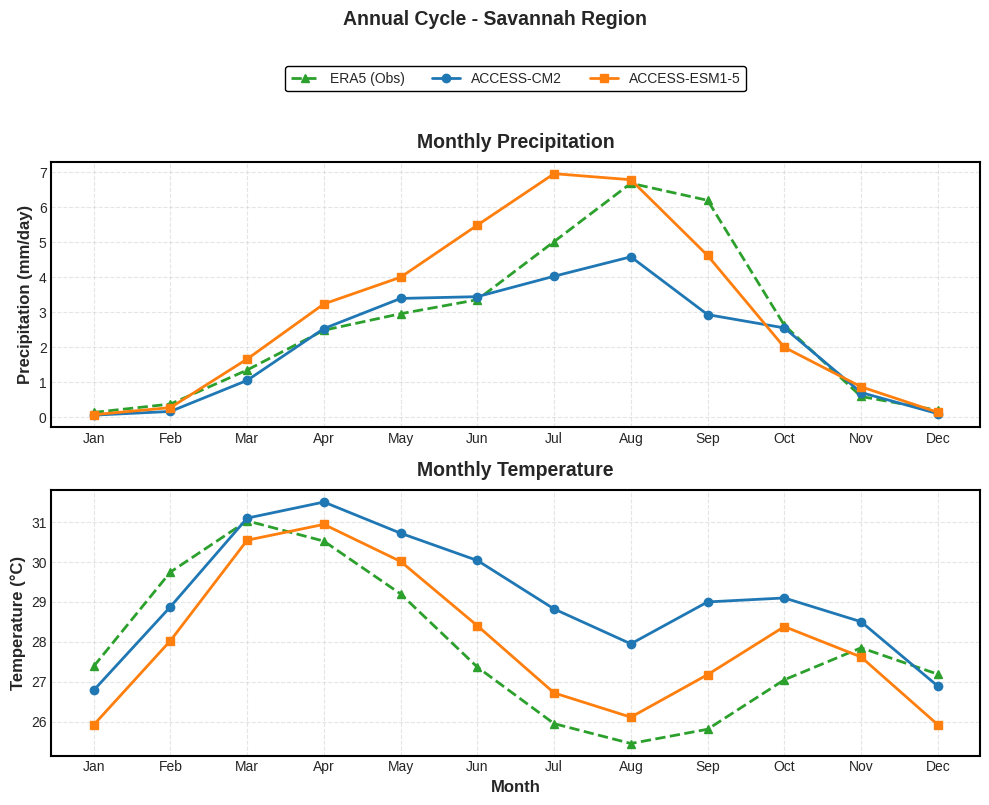


Processing complete!


In [13]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import os
from matplotlib import rcParams

# Set paths
output_dir = "model_trial_Domain"
plot_dir = "subdomain_plots"
os.makedirs(plot_dir, exist_ok=True)

# Enable inline plotting
%matplotlib inline

# Custom plot settings
plt.style.use('seaborn-v0_8-whitegrid')
rcParams.update({
    'font.size': 10,  # Slightly smaller font
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'axes.linewidth': 1.5,
    'grid.alpha': 0.3,
    'lines.linewidth': 2,
    'lines.markersize': 6,
    'legend.fontsize': 10,
    'legend.framealpha': 1,
    'legend.edgecolor': 'black'
})

# Define models and variables
models = {
    'ACCESS-CM2': {'color': '#1f77b4', 'linestyle': '-', 'marker': 'o'},
    'ACCESS-ESM1-5': {'color': '#ff7f0e', 'linestyle': '-', 'marker': 's'},
    'ERA5': {'color': '#2ca02c', 'linestyle': '--', 'marker': '^'}  # Observations
}

variables = {
    'pr': {'name': 'Precipitation', 'unit': 'mm/day', 'ylabel': 'Precipitation (mm/day)'},
    'tas': {'name': 'Temperature', 'unit': '°C', 'ylabel': 'Temperature (°C)'}
}

def load_data(region):
    """Load all available data for a region"""
    data = {}
    
    # Observation data
    try:
        data['obs_pr'] = xr.open_dataset(f"{output_dir}/obs_pr_fldclim_mmday_{region}.nc")
        data['obs_tas'] = xr.open_dataset(f"{output_dir}/obs_tas_fldclim_C_{region}.nc")
    except FileNotFoundError as e:
        print(f"Warning: Missing observation data for {region} - {str(e)}")
    
    # Model data
    for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
        try:
            data[f'{model.lower()}_pr'] = xr.open_dataset(f"{output_dir}/pr_{model}_fldclim_mmday_{region}.nc")
            data[f'{model.lower()}_tas'] = xr.open_dataset(f"{output_dir}/tas_{model}_fldclim_C_{region}.nc")
        except FileNotFoundError as e:
            print(f"Warning: Missing {model} data for {region} - {str(e)}")
    
    return data if data else None

def plot_annual_cycle(region, data):
    """Plot annual cycle for all available models and observations"""
    if not data:
        print(f"No data available for {region}")
        return
    
    # Create figure with dynamic sizing
    fig = plt.figure(figsize=(10, 8))
    gs = fig.add_gridspec(3, 1, height_ratios=[0.15, 1, 1])  # Space for legend
    
    # Create axes
    ax_legend = fig.add_subplot(gs[0])
    ax_legend.axis('off')  # We'll use this for the legend
    
    ax1 = fig.add_subplot(gs[1])  # Precipitation
    ax2 = fig.add_subplot(gs[2])  # Temperature
    
    fig.suptitle(f"Annual Cycle - {region} Region", y=1.0, fontsize=14, weight='bold')
    
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    
    # Plot Precipitation
    lines = []
    labels = []
    
    if 'obs_pr' in data:
        obs_pr = data['obs_pr']['avg_tprate'].values.flatten()
        line, = ax1.plot(months, obs_pr,
                        color=models['ERA5']['color'], 
                        linestyle=models['ERA5']['linestyle'],
                        marker=models['ERA5']['marker'])
        lines.append(line)
        labels.append('ERA5 (Obs)')
    
    for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
        key = f'{model.lower()}_pr'
        if key in data:
            model_pr = data[key]['pr'].values.flatten()
            line, = ax1.plot(months, model_pr,
                            color=models[model]['color'],
                            linestyle=models[model]['linestyle'],
                            marker=models[model]['marker'])
            lines.append(line)
            labels.append(model)
    
    ax1.set_ylabel(variables['pr']['ylabel'])
    ax1.grid(True, linestyle='--', alpha=0.5)
    ax1.set_title("Monthly Precipitation", pad=10)
    
    # Plot Temperature
    if 'obs_tas' in data:
        obs_tas = data['obs_tas']['t2m'].values.flatten()
        ax2.plot(months, obs_tas,
                color=models['ERA5']['color'], 
                linestyle=models['ERA5']['linestyle'],
                marker=models['ERA5']['marker'])
    
    for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
        key = f'{model.lower()}_tas'
        if key in data:
            model_tas = data[key]['tas'].values.flatten()
            ax2.plot(months, model_tas,
                    color=models[model]['color'],
                    linestyle=models[model]['linestyle'],
                    marker=models[model]['marker'])
    
    ax2.set_ylabel(variables['tas']['ylabel'])
    ax2.set_xlabel("Month")
    ax2.grid(True, linestyle='--', alpha=0.5)
    ax2.set_title("Monthly Temperature", pad=10)
    
    # Create legend in its dedicated space
    ax_legend.legend(lines, labels, 
                    loc='center',
                    ncol=min(3, len(lines)),  # Max 3 columns
                    frameon=True)
    
    # Customize spines
    for ax in [ax1, ax2]:
        for spine in ax.spines.values():
            spine.set_linewidth(1.5)
            spine.set_color('black')
    
    plt.tight_layout()
    
    # Save and show plot
    plot_path = f"{plot_dir}/annual_cycle_{region}.png"
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"Plot saved to {plot_path}")
    plt.show()
    plt.close()

# Process all regions
regions = ['Asante ', 'Savannah']

for region in regions:
    print(f"\n{'='*50}")
    print(f"Processing {region} region")
    print(f"{'='*50}")
    
    data = load_data(region)
    plot_annual_cycle(region, data)

print("\nProcessing complete!")


Processing Asante region
Plot saved to subdomain_plots/annual_cycle_Asante.png


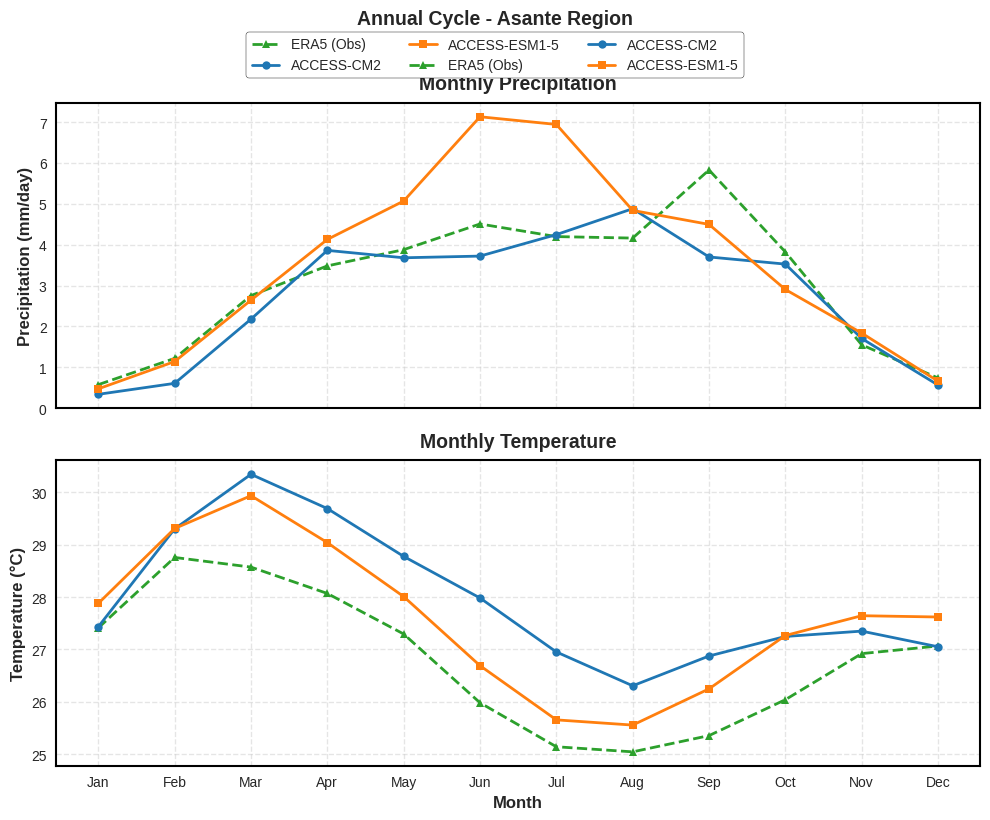


Processing Savannah region
Plot saved to subdomain_plots/annual_cycle_Savannah.png


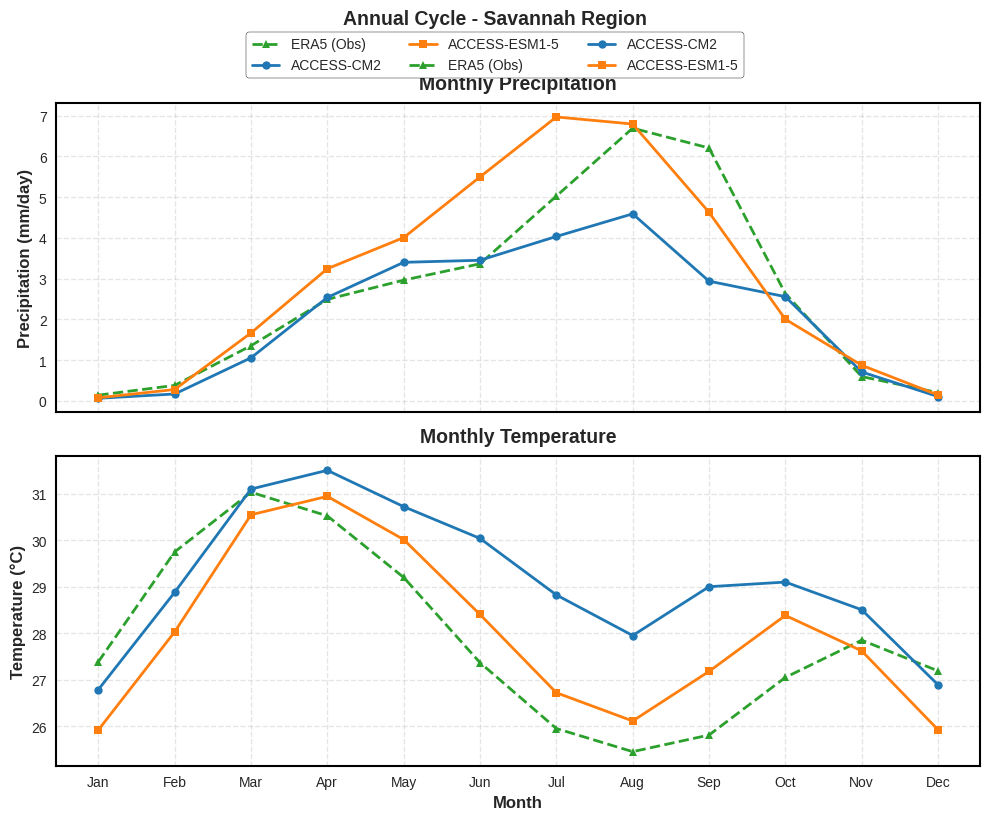


Processing complete!


In [58]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import os
from matplotlib import rcParams

# Set paths
output_dir = "model_trial_Domain"
plot_dir = "subdomain_plots"
os.makedirs(plot_dir, exist_ok=True)

# Custom plot settings
plt.style.use('seaborn-v0_8-whitegrid')
rcParams.update({
    'font.size': 10,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'axes.linewidth': 1.5,
    'grid.alpha': 0.3,
    'lines.linewidth': 2,
    'lines.markersize': 6,
    'legend.fontsize': 10,
    'legend.framealpha': 1,
    'legend.edgecolor': 'black'
})

# Define models and variables with improved colors
models = {
    'ACCESS-CM2': {'color': '#1f77b4', 'linestyle': '-', 'marker': 'o'},
    'ACCESS-ESM1-5': {'color': '#ff7f0e', 'linestyle': '-', 'marker': 's'},
    'ERA5': {'color': '#2ca02c', 'linestyle': '--', 'marker': '^'}  # Observations
}

variables = {
    'pr': {'name': 'Precipitation', 'unit': 'mm/day', 'ylabel': 'Precipitation (mm/day)'},
    'tas': {'name': 'Temperature', 'unit': '°C', 'ylabel': 'Temperature (°C)'}
}

def load_data(region):
    """Load all available data for a region with better error handling"""
    data = {}
    region = region.strip()  # Clean whitespace from region name
    
    # Try loading observation data
    obs_files = {
        'pr': f"{output_dir}/obs_pr_fldclim_mmday_{region}.nc",
        'tas': f"{output_dir}/obs_tas_fldclim_C_{region}.nc"
    }
    
    for var, path in obs_files.items():
        try:
            data[f'obs_{var}'] = xr.open_dataset(path)
        except FileNotFoundError:
            print(f"Note: Observation data not found for {var} in {region}")
    
    # Try loading model data
    for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
        model_files = {
            'pr': f"{output_dir}/pr_{model}_fldclim_mmday_{region}.nc",
            'tas': f"{output_dir}/tas_{model}_fldclim_C_{region}.nc"
        }
        
        for var, path in model_files.items():
            try:
                data[f'{model.lower()}_{var}'] = xr.open_dataset(path)
            except FileNotFoundError:
                print(f"Note: {model} data not found for {var} in {region}")
    
    return data if data else None

def plot_annual_cycle(region, data):
    """Plot annual cycle with improved empty data handling"""
    region = region.strip()  # Clean whitespace
    
    if not data:
        print(f"\nNo data available to plot for {region} region")
        return
    
    # Create figure with dynamic sizing
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
    fig.suptitle(f"Annual Cycle - {region} Region", y=1.02, fontsize=14, weight='bold')
    
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    
    # Track lines for legend
    legend_lines = []
    legend_labels = []
    
    # Plot Precipitation if available
    if any('pr' in key for key in data.keys()):
        # Plot observations
        if 'obs_pr' in data:
            obs_pr = data['obs_pr']['avg_tprate'].values.flatten()
            line = ax1.plot(months, obs_pr, **models['ERA5'], label='ERA5 (Obs)')[0]
            legend_lines.append(line)
            legend_labels.append('ERA5 (Obs)')
        
        # Plot models
        for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
            key = f'{model.lower()}_pr'
            if key in data:
                model_pr = data[key]['pr'].values.flatten()
                line = ax1.plot(months, model_pr, **models[model], label=model)[0]
                legend_lines.append(line)
                legend_labels.append(model)
        
        ax1.set_ylabel(variables['pr']['ylabel'])
        ax1.grid(True, linestyle='--', alpha=0.5)
        ax1.set_title("Monthly Precipitation", pad=10)
    else:
        ax1.set_visible(False)  # Hide if no precipitation data
    
    # Plot Temperature if available
    if any('tas' in key for key in data.keys()):
        # Plot observations
        if 'obs_tas' in data:
            obs_tas = data['obs_tas']['t2m'].values.flatten()
            line = ax2.plot(months, obs_tas, **models['ERA5'], label='ERA5 (Obs)')[0]
            if 'pr' not in data:  # Only add to legend if no precipitation plot
                legend_lines.append(line)
                legend_labels.append('ERA5 (Obs)')
        
        # Plot models
        for model in ['ACCESS-CM2', 'ACCESS-ESM1-5']:
            key = f'{model.lower()}_tas'
            if key in data:
                model_tas = data[key]['tas'].values.flatten()
                line = ax2.plot(months, model_tas, **models[model], label=model)[0]
                if 'pr' not in data:  # Only add to legend if no precipitation plot
                    legend_lines.append(line)
                    legend_labels.append(model)
        
        ax2.set_ylabel(variables['tas']['ylabel'])
        ax2.set_xlabel("Month")
        ax2.grid(True, linestyle='--', alpha=0.5)
        ax2.set_title("Monthly Temperature", pad=10)
    else:
        ax2.set_visible(False)  # Hide if no temperature data
    
    # Only create legend if we have data to show
    if legend_lines:
        fig.legend(legend_lines, legend_labels, 
                  loc='upper center',
                  ncol=min(3, len(legend_lines)),
                  bbox_to_anchor=(0.5, 1.0),
                  frameon=True)
    
    # Customize spines
    for ax in [ax1, ax2]:
        if ax.get_visible():  # Only modify visible axes
            for spine in ax.spines.values():
                spine.set_linewidth(1.5)
                spine.set_color('black')
    
    plt.tight_layout()
    
    # Save plot
    plot_path = f"{plot_dir}/annual_cycle_{region}.png"
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"Plot saved to {plot_path}")
    plt.show()
    plt.close()

# Process all regions - with cleaned region names
regions = ['Asante', 'Savannah']  # Removed trailing space

for region in regions:
    print(f"\n{'='*50}")
    print(f"Processing {region} region")
    print(f"{'='*50}")
    
    data = load_data(region)
    plot_annual_cycle(region, data)

print("\nProcessing complete!")

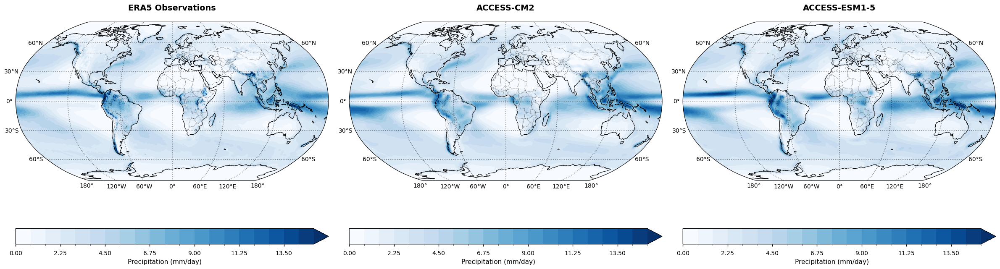

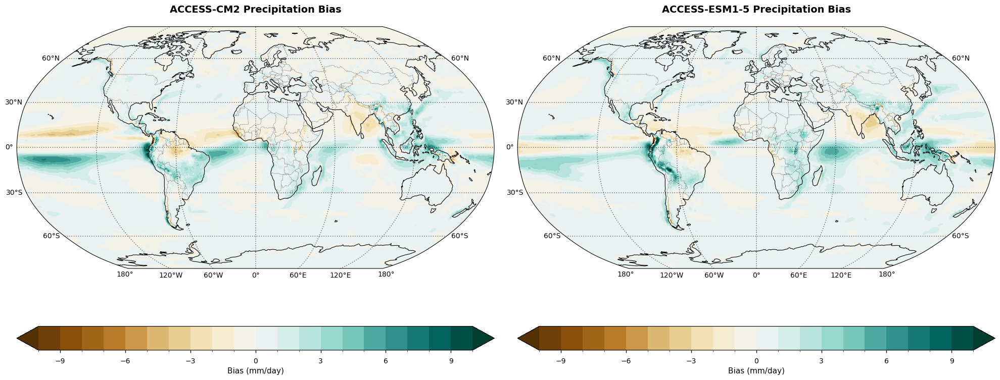

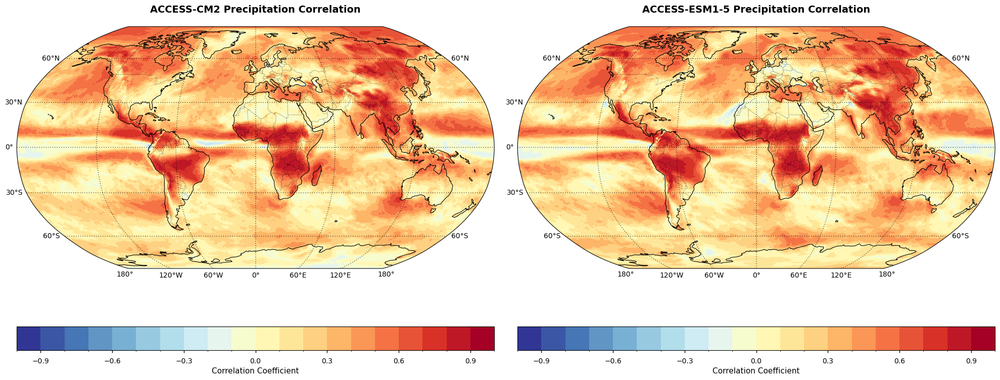

Failed to plot precipitation_rmse_comparison.png: Unable to allocate 3.45 PiB for an array with shape (30, 721, 1440, 30, 721, 1440) and data type float32
Failed to process precipitation: Unable to allocate 3.45 PiB for an array with shape (30, 721, 1440, 30, 721, 1440) and data type float32


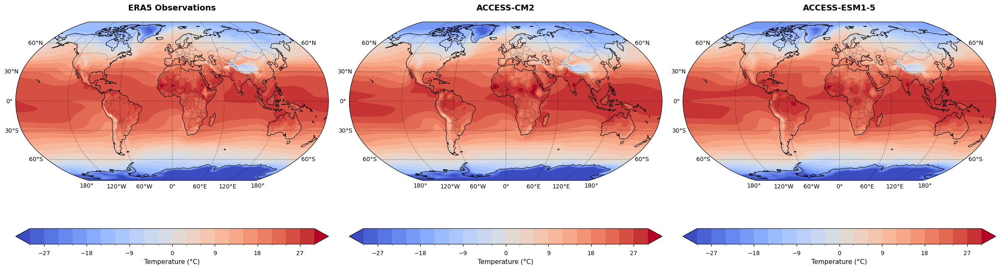

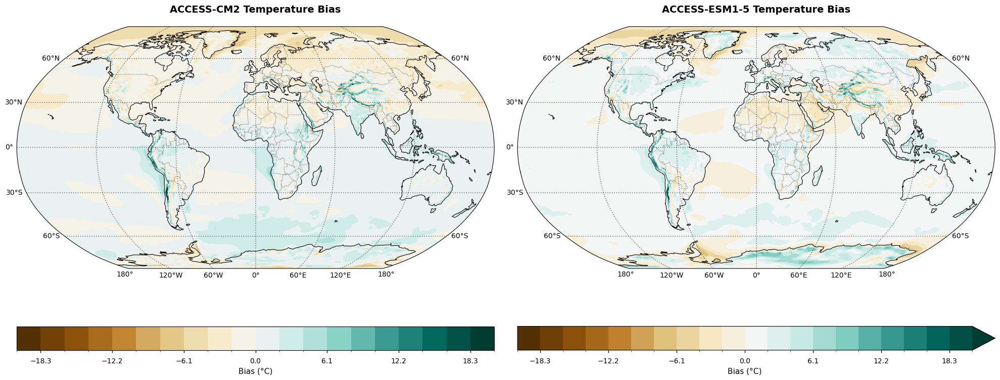

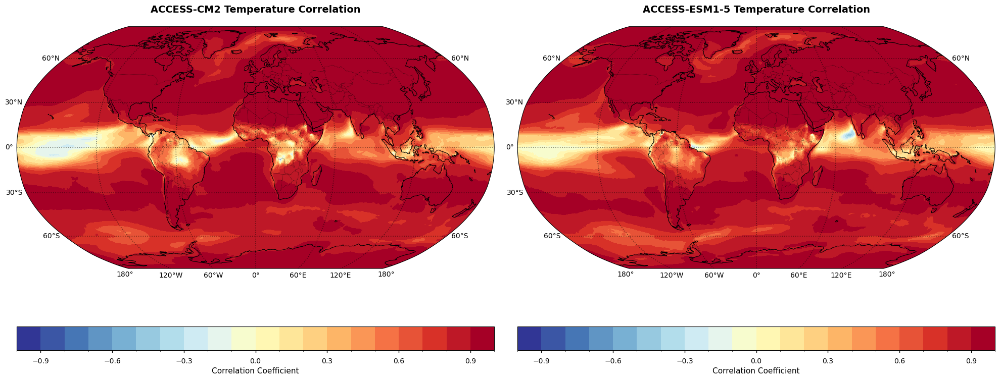

Failed to plot temperature_rmse_comparison.png: Unable to allocate 3.45 PiB for an array with shape (30, 721, 1440, 30, 721, 1440) and data type float32
Failed to process temperature: Unable to allocate 3.45 PiB for an array with shape (30, 721, 1440, 30, 721, 1440) and data type float32
All plots saved to new_plots directory


In [11]:
import os
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from IPython.display import display

# Set paths
output_dir = "model_trial"
plot_dir = "new_plots"
os.makedirs(plot_dir, exist_ok=True)

# Custom plot settings with enhanced title styling
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'axes.titlepad': 20
})

# Colormaps
PRECIP_CMAP = 'Blues'
TEMP_CMAP = 'coolwarm'
BIAS_CMAP = 'BrBG'
CORR_CMAP = 'RdYlBu_r'
RMSE_CMAP = 'YlOrRd'

def prepare_data(da):
    """Ensure data is 2D by taking mean over time if needed"""
    time_dims = [dim for dim in da.dims if dim in ['time', 'valid_time', 't']]
    if time_dims:
        da = da.mean(dim=time_dims)
    
    lat_dims = [dim for dim in da.dims if dim in ['lat', 'latitude', 'y']]
    lon_dims = [dim for dim in da.dims if dim in ['lon', 'longitude', 'x']]
    
    if not lat_dims or not lon_dims:
        raise ValueError("Cannot identify spatial dimensions")
    
    return da.transpose(*lat_dims, *lon_dims)

def calculate_rmse(model_data, obs_data):
    """Calculate root mean squared error"""
    return np.sqrt(np.mean((model_data - obs_data)**2))

def plot_climatology(models, variable_type):
    """Plot climatology for obs + models (3 panels)"""
    var = 'pr' if variable_type == 'precipitation' else 'tas'
    obs_var = 'avg_tprate' if variable_type == 'precipitation' else 't2m'
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), 
                           subplot_kw={'projection': ccrs.Robinson()})
    
    try:
        # Set parameters based on variable type
        if variable_type == 'precipitation':
            cmap = PRECIP_CMAP
            units = 'Precipitation (mm/day)'
            vmin, vmax = 0, 15
        else:
            cmap = TEMP_CMAP
            units = 'Temperature (°C)'
            vmin, vmax = -30, 30
        
        # Plot observations with enhanced title
        obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_yrclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
        obs_data = prepare_data(obs_ds[obs_var])
        obs_data.plot.contourf(ax=axes[0], transform=ccrs.PlateCarree(),
                             cmap=cmap, levels=21, vmin=vmin, vmax=vmax,
                             cbar_kwargs={'label': units, 'orientation': 'horizontal'})
        axes[0].set_title('ERA5 Observations', fontweight='bold', fontsize=14, pad=20)
        
        # Plot each model with enhanced titles
        for i, model in enumerate(models, 1):
            model_ds = xr.open_dataset(f"{output_dir}/{var}_{model}_yrclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
            model_data = prepare_data(model_ds[var])
            model_data.plot.contourf(ax=axes[i], transform=ccrs.PlateCarree(),
                                   cmap=cmap, levels=21, vmin=vmin, vmax=vmax,
                                   cbar_kwargs={'label': units, 'orientation': 'horizontal'})
            axes[i].set_title(model, fontweight='bold', fontsize=14, pad=20)
        
        # Add map features and gridlines to all subplots
        for ax in axes:
            ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                            linewidth=1.2, color='black', alpha=0.5, linestyle=':')
            gl.top_labels = False
            gl.right_labels = False
            gl.xlabel_style = {'size': 10, 'color': 'black'}
            gl.ylabel_style = {'size': 10, 'color': 'black'}
        
        plt.tight_layout()
        filename = f"{variable_type}_climatology_comparison.png"
        plt.savefig(os.path.join(plot_dir, filename), bbox_inches='tight', dpi=300)
        display(fig)
        plt.close()
    except Exception as e:
        print(f"Failed to plot climatology for {variable_type}: {str(e)}")
        plt.close()

def plot_side_by_side(models, data_func, titles, filename, variable_type, plot_type='bias'):
    """Plot two models side by side with gridlines"""
    fig, axes = plt.subplots(1, 2, figsize=(20, 8), 
                           subplot_kw={'projection': ccrs.Robinson()})
    
    try:
        # Set parameters based on plot type
        if plot_type == 'bias':
            cmap = BIAS_CMAP
            if variable_type == 'precipitation':
                units = 'Bias (mm/day)'
                levels = np.linspace(-10, 10, 21)
            else:
                units = 'Bias (°C)'
                max_abs = np.nanmax(np.abs(prepare_data(data_func(models[0])).values))
                levels = np.linspace(-max_abs, max_abs, 21)
        elif plot_type == 'correlation':
            cmap = CORR_CMAP
            units = 'Correlation Coefficient'
            levels = np.linspace(-1, 1, 21)
        elif plot_type == 'rmse':
            cmap = RMSE_CMAP
            if variable_type == 'precipitation':
                units = 'RMSE (mm/day)'
                levels = np.linspace(0, 10, 21)
            else:
                units = 'RMSE (°C)'
                levels = np.linspace(0, 5, 21)
        
        for i, (model, ax) in enumerate(zip(models, axes)):
            # Get data using the provided function
            data = data_func(model)
            plot_data = prepare_data(data)
            
            # Plot the data
            plot_data.plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                                 cmap=cmap, levels=levels,
                                 cbar_kwargs={'label': units, 'orientation': 'horizontal'})
            
            # Add map features
            ax.add_feature(cfeature.COASTLINE, linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
            
            # Configure gridlines
            gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                            linewidth=1.2, color='black', alpha=0.5, linestyle=':')
            gl.top_labels = False
            gl.right_labels = False
            gl.xlabel_style = {'size': 10, 'color': 'black'}
            gl.ylabel_style = {'size': 10, 'color': 'black'}
            
            # Enhanced title with black border for better visibility
            ax.set_title(titles[i], fontweight='bold', fontsize=14, pad=20)
        
        plt.tight_layout()
        plt.savefig(os.path.join(plot_dir, filename), bbox_inches='tight', dpi=300)
        display(fig)
        plt.close()
    except Exception as e:
        print(f"Failed to plot {filename}: {str(e)}")
        plt.close()

def plot_seasonal_cycle(models, variable_type):
    """Plot monthly climatology comparison"""
    fig = plt.figure(figsize=(10, 6))
    var = 'pr' if variable_type == 'precipitation' else 'tas'
    obs_var = 'avg_tprate' if variable_type == 'precipitation' else 't2m'
    units = 'Precipitation (mm/day)' if variable_type == 'precipitation' else 'Temperature (°C)'
    
    try:
        # Load observed data
        obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_monclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
        obs_data = obs_ds[obs_var]
        
        # Calculate global mean
        lat_dims = [dim for dim in obs_data.dims if dim in ['lat', 'latitude', 'y']]
        lon_dims = [dim for dim in obs_data.dims if dim in ['lon', 'longitude', 'x']]
        global_obs = obs_data.mean(dim=(lat_dims[0], lon_dims[0]))
        
        plt.plot(global_obs, label='ERA5', color='black', linewidth=3, marker='o')
        
        # Plot each model
        colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Distinct colors for models
        for i, model in enumerate(models):
            ds = xr.open_dataset(f"{output_dir}/{var}_{model}_monclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
            model_data = ds[var]
            
            lat_dims = [dim for dim in model_data.dims if dim in ['lat', 'latitude', 'y']]
            lon_dims = [dim for dim in model_data.dims if dim in ['lon', 'longitude', 'x']]
            global_mean = model_data.mean(dim=(lat_dims[0], lon_dims[0]))
            
            plt.plot(global_mean, label=model, color=colors[i], linestyle='--', marker='o')
        
        # Enhanced title with larger font and bold weight
        plt.title(f"Global Mean {variable_type.capitalize()} Seasonal Cycle", 
                 fontweight='bold', fontsize=14, pad=20)
        plt.xlabel('Month', fontsize=12)
        plt.ylabel(units, fontsize=12)
        plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                              'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        plt.legend(fontsize=12)
        plt.grid(True, alpha=0.3)
        
        filename = f"{variable_type}_seasonal_cycle.png"
        plt.savefig(os.path.join(plot_dir, filename), bbox_inches='tight', dpi=300)
        display(fig)
        plt.close()
    except Exception as e:
        print(f"Failed to plot seasonal cycle for {variable_type}: {str(e)}")
        plt.close()

def create_comparison_plots():
    """Create all comparison plots"""
    models = ['ACCESS-CM2', 'ACCESS-ESM1-5']
    
    for variable_type in ['precipitation', 'temperature']:
        var = 'pr' if variable_type == 'precipitation' else 'tas'
        obs_var = 'avg_tprate' if variable_type == 'precipitation' else 't2m'
        
        try:
            # 1. First plot climatology comparison (3 panels)
            plot_climatology(models, variable_type)
            
            # Load observed data for calculations
            obs_ds = xr.open_dataset(f"{output_dir}/obs_{var}_yrclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
            obs_data = obs_ds[obs_var]
            
            # Define data access functions
            def get_bias_data(model):
                ds = xr.open_dataset(f"{output_dir}/{var}_{model}_yrbias_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
                return ds[var]
            
            def get_corr_data(model):
                ds = xr.open_dataset(f"{output_dir}/{var}_{model}_correlation.nc")
                return ds[var]
            
            def get_rmse_data(model):
                model_ds = xr.open_dataset(f"{output_dir}/{var}_{model}_yrclim_{'mmday.nc' if variable_type == 'precipitation' else 'C.nc'}")
                model_data = model_ds[var]
                if model_data.dims != obs_data.dims:
                    model_data = model_data.interp_like(obs_data)
                return np.sqrt((model_data - obs_data)**2)
            
            # 2. Plot bias, correlation, and RMSE comparisons
            plot_side_by_side(models, get_bias_data, 
                            [f"{model} {variable_type.capitalize()} Bias" for model in models],
                            f"{variable_type}_bias_comparison.png", variable_type, 'bias')
            
            plot_side_by_side(models, get_corr_data,
                            [f"{model} {variable_type.capitalize()} Correlation" for model in models],
                            f"{variable_type}_corr_comparison.png", variable_type, 'correlation')
            
            plot_side_by_side(models, get_rmse_data,
                            [f"{model} {variable_type.capitalize()} RMSE" for model in models],
                            f"{variable_type}_rmse_comparison.png", variable_type, 'rmse')
            
            # Print RMSE values
            for model in models:
                rmse = calculate_rmse(get_rmse_data(model).values, np.zeros_like(get_rmse_data(model).values))
                print(f"{model} {variable_type} RMSE: {rmse:.2f}")
            
            # 3. Plot seasonal cycle at the end
            plot_seasonal_cycle(models, variable_type)
                
        except Exception as e:
            print(f"Failed to process {variable_type}: {str(e)}")
            continue

    print(f"All plots saved to {plot_dir} directory")

create_comparison_plots()

<div class="alert alert-block alert-info">

# **Cloud cover**
</div>

In [ ]:
%%bash

# Cloud Cover Processing: Global Maps + Subdomain Analysis
INPUT_FILE="cc_ERA5_1991-2020.nc"
OUTPUT_DIR="cloud_output"
mkdir -p "$OUTPUT_DIR"

# Subdomain bounds (Asante Akim North)
LON_MIN=-1.20
LON_MAX=-0.15
LAT_MIN=6.30
LAT_MAX=7.30

#  GLOBAL SPATIAL MAPS
echo "Processing global spatial maps..."
cdo yearmean "$INPUT_FILE" "${OUTPUT_DIR}/global_annual_means.nc"                # Annual means (30 years)
cdo timmean "${OUTPUT_DIR}/global_annual_means.nc" "${OUTPUT_DIR}/global_clim_mean.nc"  # 30-year climatology

#  SUBDOMAIN ANALYSIS 
echo "Processing subdomain (Asante Akim North)..."
cdo sellonlatbox,$LON_MIN,$LON_MAX,$LAT_MIN,$LAT_MAX "$INPUT_FILE" "${OUTPUT_DIR}/subdomain.nc"

# Monthly climatology (12-month cycle)
cdo ymonmean "${OUTPUT_DIR}/subdomain.nc" "${OUTPUT_DIR}/subdomain_monthly_clim.nc"
cdo fldmean "${OUTPUT_DIR}/subdomain_monthly_clim.nc" "${OUTPUT_DIR}/subdomain_annual_cycle.nc"

# Vertical profiles (high/mid/low clouds)
cdo sellevidx,1/3   "${OUTPUT_DIR}/subdomain.nc" "${OUTPUT_DIR}/subdomain_high_clouds.nc"   # 100-200 hPa
cdo sellevidx,20/23 "${OUTPUT_DIR}/subdomain.nc" "${OUTPUT_DIR}/subdomain_mid_clouds.nc"   # 500-700 hPa
cdo sellevidx,37    "${OUTPUT_DIR}/subdomain.nc" "${OUTPUT_DIR}/subdomain_low_clouds.nc"   # 1000 hPa

# Convert all to percentage (0-100%)
for file in global_annual_means global_clim_mean subdomain_monthly_clim subdomain_annual_cycle subdomain_high_clouds subdomain_mid_clouds subdomain_low_clouds; do
    cdo mulc,100 "${OUTPUT_DIR}/${file}.nc" "${OUTPUT_DIR}/${file}_percent.nc"
done

echo "Processing complete! Outputs saved in ${OUTPUT_DIR}/"

Processing global spatial maps...


cdi  warning (cdfScanVarAttr): NetCDF: Variable not found - >isobaricInhPa<
variables): Unsupported data type (char/string), skipped variable expver!
cdi  warning (cdfInqContents): Coordinates variable number can't be assigned!


Processing subdomain (Asante Akim North)...


cdi  warning (cdfScanVarAttr): NetCDF: Variable not found - >isobaricInhPa<
variables): Unsupported data type (char/string), skipped variable expver!
ts): Coordinates variable number can't be assigned!


In [1]:
%%bash
OUTPUT_DIR="cloud_output"
echo "Processing subdomain (Asante Akim North)..."
cdo sellonlatbox,-1.20,-0.15,6.30,7.30 "${OUTPUT_DIR}/global_clim_mean.nc"  "${OUTPUT_DIR}/subdomain.nc"
# Monthly climatology (12-month cycle)
cdo ymonmean "${OUTPUT_DIR}/subdomain.nc" "${OUTPUT_DIR}/subdomain_monthly_clim.nc"
cdo timmean  "${OUTPUT_DIR}/subdomain_monthly_clim.nc"  "${OUTPUT_DIR}/subdomain_t_clim.nc"
cdo fldmean "${OUTPUT_DIR}/subdomain_t_clim.nc" "${OUTPUT_DIR}/subdomain_annual_cycle.nc"

Processing subdomain (Asante Akim North)...


In [6]:
cloud = xr.open_dataset('cloud_output/subdomain_annual_cycle.nc')
cloud

<xarray.Dataset> Size: 484B
Dimensions:          (valid_time: 1, bnds: 2, lon: 1, lat: 1, pressure_level: 37)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T12:00:00
  * lon              (lon) float64 8B 0.0
  * lat              (lat) float64 8B 0.0
  * pressure_level   (pressure_level) float64 296B 1e+03 975.0 950.0 ... 2.0 1.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    cc               (valid_time, pressure_level, lat, lon) float32 148B ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    frequency:               year
    history:                 Thu Apr 10 20:06:48 2025: cdo fldmean cloud_outp...
    CDO:                     Climate Data Operators version 2.4.4 (https://mp...

### 

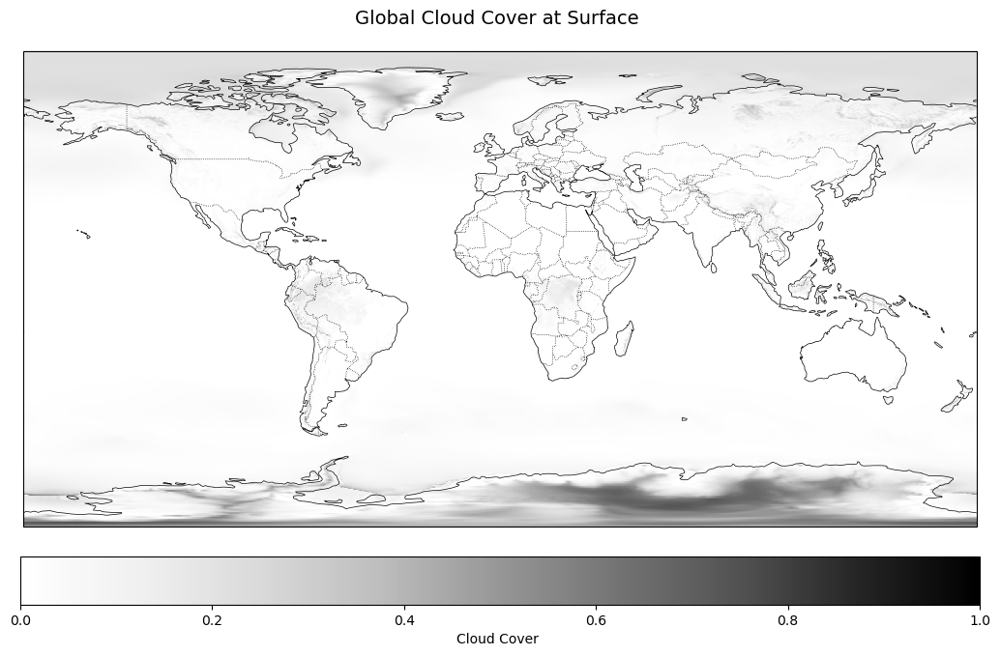

In [34]:
plot_global_maps()

### 

In [12]:
def plot_global_maps(output_dir="cloud_output"):
    %matplotlib inline
    try:
        # Load data
        ds = xr.open_dataset(f"{output_dir}/global_clim_mean.nc")
        
        # Convert cloud fraction to percentage if needed
        if ds['cc'].max() <= 1:
            cc_data = ds['cc'] * 100
        else:
            cc_data = ds['cc']
        
        # Select surface level and first time step
        cc_surface = cc_data.isel(valid_time=0, pressure_level=0)
        
        # Create plot
        plt.figure(figsize=(16, 8))
        ax = plt.axes(projection=ccrs.PlateCarree())
        
        # Plot with proper coordinates
        im = cc_surface.plot.pcolormesh(
            ax=ax,
            x='longitude',
            y='latitude',
            cmap='Greys',  # Reversed colormap
            vmin=0,
            vmax=100,  # Percentage scale
            add_colorbar=False
        )
        
        # Add map features
        ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
        ax.add_feature(cfeature.BORDERS, linestyle=':', linewidth=0.5)
        ax.set_title("Global climatology of Cloud Cover at Low-Levels ", pad=20, fontsize=14)
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
        cbar.set_label('Cloud Cover (%)')
        
        # Save and show
        plt.savefig(f"{output_dir}/global_clim_map.png", dpi=300, bbox_inches='tight')
        plt.show()
        
    except Exception as e:
        print(f"Error: {str(e)}")
        raise

Saved: cloud_vertical_profile.png
Saved: cloud_vertical_profile.svg
Saved: cloud_vertical_profile.pdf


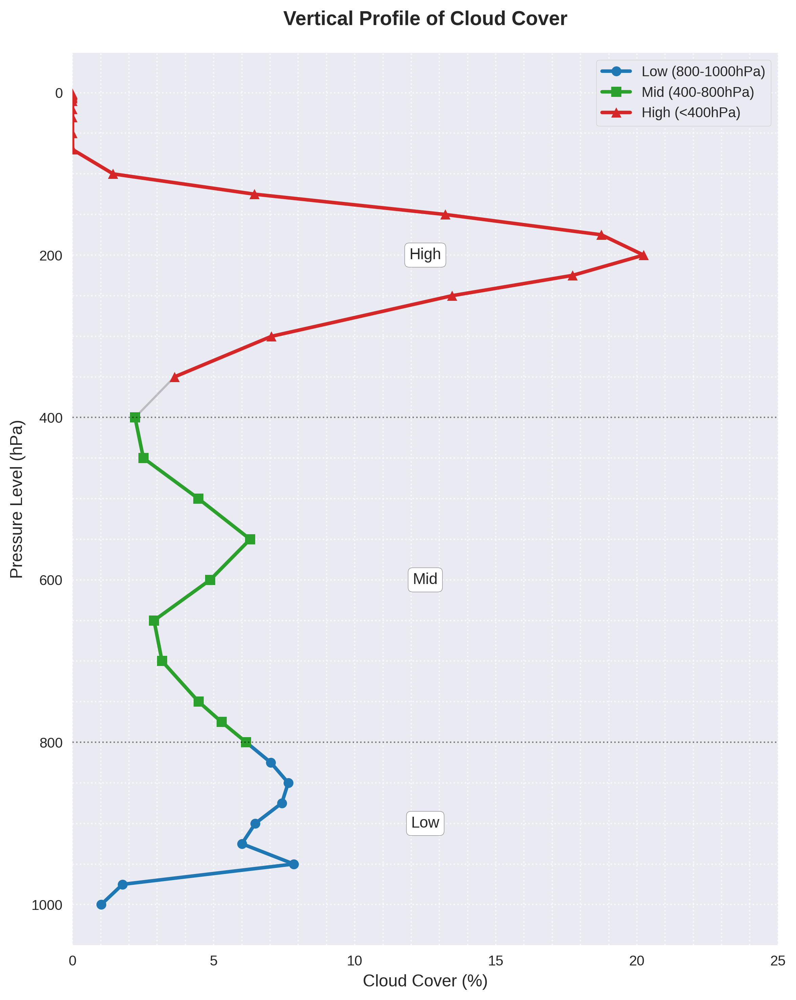

In [18]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import AutoMinorLocator

# Load the data
file_path = "cloud_output/subdomain_annual_cycle.nc"
ds = xr.open_dataset(file_path)

# Extract the cloud cover data
cc_data = ds['cc'].squeeze().values * 100  # Convert to percentage
pressure_levels = ds['pressure_level'].values

# Define level boundaries and connection points
LEVELS = {
    'Low': {'range': (800, 1000), 'color': '#1f77b4', 'marker': 'o'},
    'Mid': {'range': (400, 800), 'color': '#2ca02c', 'marker': 's'},
    'High': {'range': (0, 400), 'color': '#d62728', 'marker': '^'}
}

# Create figure
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
plt.style.use('seaborn-v0_8-notebook')

# First plot all points together to ensure connection
full_mask = pressure_levels <= 1000  # Include all valid points
ax.plot(cc_data[full_mask], pressure_levels[full_mask], 
        'k-', alpha=0.2, linewidth=1.5, zorder=1)

# Then plot each level with connection points
for name, props in LEVELS.items():
    bottom, top = props['range']
    if name == 'High':
        mask = pressure_levels < top
        # Include one extra point from Mid range for connection
        connection_point = np.sum(pressure_levels >= top)
        mask[connection_point] = True
    elif name == 'Mid':
        mask = (pressure_levels >= bottom) & (pressure_levels <= top)
        # Include one extra point from Low range for connection
        connection_point = np.sum(pressure_levels > top)
        mask[connection_point] = True
    else:
        mask = (pressure_levels >= bottom) & (pressure_levels <= top)
    
    ax.plot(cc_data[mask], pressure_levels[mask],
            color=props['color'],
            linewidth=2.5,
            marker=props['marker'],
            markersize=7,
            markeredgecolor='w',
            markerfacecolor=props['color'],
            label=f'{name} ({bottom}-{top}hPa)' if name != 'High' else f'{name} (<{top}hPa)',
            zorder=2)

# Enhanced plot customization
ax.set_title('Vertical Profile of Cloud Cover', fontsize=14, pad=20, fontweight='bold')
ax.set_xlabel('Cloud Cover (%)', fontsize=12)
ax.set_ylabel('Pressure Level (hPa)', fontsize=12)
ax.grid(True, which='both', linestyle=':', alpha=0.7)
ax.legend(frameon=True, framealpha=1, loc='upper right', fontsize=10)

# Axis formatting
ax.set_xlim(0, 25)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.invert_yaxis()

# Add level boundaries and annotations
for boundary in [400, 800]:
    ax.axhline(boundary, color='k', linestyle=':', alpha=0.5, linewidth=1)
    
for name in LEVELS:
    bottom, top = LEVELS[name]['range']
    y_pos = (bottom + top)/2 if name != 'High' else top/2
    ax.text(12.5, y_pos, name, 
            ha='center', va='center', 
            backgroundcolor='w',
            bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.3'),
            fontsize=11)

plt.tight_layout()

# Save figures
output_path = "cloud_vertical_profile"
for fmt in ['.png', '.svg', '.pdf']:
    plt.savefig(f"{output_path}{fmt}", bbox_inches='tight', dpi=300, facecolor='white')
    print(f"Saved: {output_path}{fmt}")

plt.show()

In [29]:
%%bash

INPUT="cc_ERA5_1991-2020.nc"
OUTPUT_DIR="cloud_output"

# 1. First extract the Asante Akim subdomain
cdo -sellonlatbox,-1.20,-0.15,6.30,7.30 $INPUT "${OUTPUT_DIR}/subdomain_raw.nc"

# 2. Compute monthly climatology (critical step)
cdo ymonmean "${OUTPUT_DIR}/subdomain_raw.nc" "${OUTPUT_DIR}/subdomain_monthly_clim.nc"

# Verify months are available
cdo showmon "${OUTPUT_DIR}/subdomain_monthly_clim.nc"

# Major Rainy Season (May-July)
cdo -select,month=5,6,7 "${OUTPUT_DIR}/subdomain_monthly_clim.nc" "${OUTPUT_DIR}/major_rainy.nc"

# Minor Rainy Season (September-November)
cdo -select,month=9,10,11 "${OUTPUT_DIR}/subdomain_monthly_clim.nc" "${OUTPUT_DIR}/minor_rainy.nc"

# Dry Season (December-April + August)
cdo -select,month=1,2,3,4,8,12 "${OUTPUT_DIR}/subdomain_monthly_clim.nc" "${OUTPUT_DIR}/dry_season.nc"

for season in major_rainy minor_rainy dry_season; do
    # Field mean first
    cdo fldmean "${OUTPUT_DIR}/${season}.nc" "${OUTPUT_DIR}/${season}_fldmean.nc"
    
    # Then vertical profile
    cdo -selname,cc "${OUTPUT_DIR}/${season}_fldmean.nc" "${OUTPUT_DIR}/${season}_cc.nc"
    cdo -vertmean "${OUTPUT_DIR}/${season}_cc.nc" "${OUTPUT_DIR}/${season}_profile.nc"
done

cdi  warning (cdfScanVarAttr): NetCDF: Variable not found - >isobaricInhPa<
cdi  warning (cdf_check_variables): Unsupported data type (char/string), skipped variable expver!
i  warning (cdfInqContents): Coordinates variable number can't be assigned!


  1  2  3  4  5  6  7  8  9 10 11 12


cdo    vertmean (Warning): Layer bounds not available, using constant vertical weights for variable cc!
cdo    vertmean (Warning): Layer bounds not available, using constant vertical weights for variable cc!
cdo    vertmean (Warning): Layer bounds not available, using constant vertical weights for variable cc!


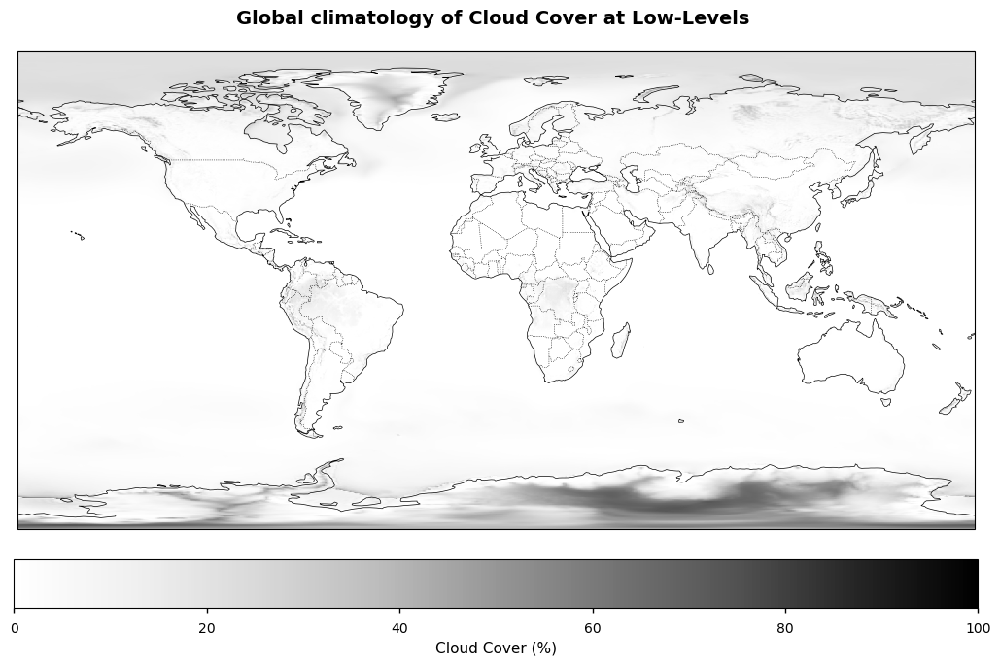

In [13]:
plot_global_maps()

In [12]:
ds = xr.open_dataset("cloud_output/global_clim_mean.nc")
print(ds)
print(ds['cc'].values.min(), ds['cc'].values.max())

<xarray.Dataset> Size: 154MB
Dimensions:          (valid_time: 1, bnds: 2, longitude: 1440, latitude: 721,
                      pressure_level: 37)
Coordinates:
  * valid_time       (valid_time) datetime64[ns] 8B 2005-12-15T12:00:00
  * longitude        (longitude) float64 12kB 0.0 0.25 0.5 ... 359.2 359.5 359.8
  * latitude         (latitude) float64 6kB 90.0 89.75 89.5 ... -89.75 -90.0
  * pressure_level   (pressure_level) float64 296B 1e+03 975.0 950.0 ... 2.0 1.0
Dimensions without coordinates: bnds
Data variables:
    valid_time_bnds  (valid_time, bnds) datetime64[ns] 16B ...
    cc               (valid_time, pressure_level, latitude, longitude) float32 154MB ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.4 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts

Processing Asante Akim  District cloud data...
Note: Using first 12 values from 37-value dataset


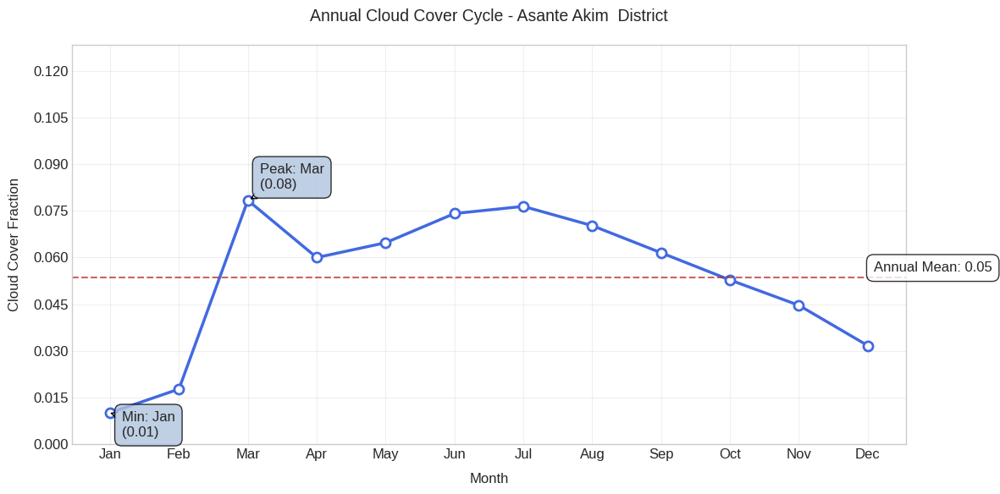

Successfully created plots:
- plots/asante_akim_north_annual_cloud_cycle.png
- plots/asante_akim_north_annual_cloud_cycle.svg

Cloud Cover Statistics:
Annual Mean: 0.054
Annual Range: 0.068
Maximum: 0.078 in Mar
Minimum: 0.010 in Jan


In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import os
import calendar
from matplotlib.ticker import MaxNLocator

# Set paths
output_dir = "cloud_output"
input_file = os.path.join(output_dir, "subdomain_annual_cycle.nc")
plot_dir = "plots"
os.makedirs(plot_dir, exist_ok=True)

# Custom plot settings
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.size': 12,
    'figure.facecolor': 'white',
    'axes.grid': True,
    'grid.alpha': 0.3,
    'axes.titlepad': 15
})

def plot_annual_cloud_cycle():
    """Plot the annual cloud cycle for the subdomain using 'cc' variable"""
    try:
        # Load data
        ds = xr.open_dataset(input_file)
        
        # Check for cloud variable
        if 'cc' not in ds:
            raise ValueError("'cc' variable not found in the dataset")
        
        # Get the data values
        cloud_data = ds['cc'].values.squeeze()
        
        # Handle different data lengths
        if len(cloud_data) == 12:
            # Already monthly data
            cloud_values = cloud_data
        elif len(cloud_data) == 37:
            # Special case for 37 values - take first 12
            print("Note: Using first 12 values from 37-value dataset")
            cloud_values = cloud_data[:12]
        else:
            # For other lengths, average into 12 bins
            print(f"Note: Reshaping {len(cloud_data)} values to 12 months")
            cloud_values = np.mean(cloud_data.reshape(-1, 12), axis=0)
        
        # Get month names
        months = [calendar.month_abbr[i] for i in range(1, 13)]
        
        # Create plot
        fig, ax = plt.subplots(figsize=(12, 6))
        
        # Plot the annual cycle
        ax.plot(months, cloud_values, 
                marker='o', 
                markersize=8,
                linestyle='-', 
                linewidth=2.5, 
                color='royalblue',
                markerfacecolor='white',
                markeredgewidth=2,
                markeredgecolor='royalblue')
        
        # Customize plot
        ax.set_title("Annual Cloud Cover Cycle - Asante Akim  District", pad=20, fontsize=14)
        ax.set_xlabel("Month", fontsize=12, labelpad=10)
        ax.set_ylabel("Cloud Cover Fraction", fontsize=12, labelpad=10)
        
        # Set y-axis limits and ticks
        ymin = max(0, np.min(cloud_values)-0.05)
        ymax = min(1, np.max(cloud_values)+0.05)
        ax.set_ylim(ymin, ymax)
        ax.yaxis.set_major_locator(MaxNLocator(10))
        ax.grid(True, which='both', alpha=0.3)
        
        # Highlight max and min months
        max_val = np.max(cloud_values)
        min_val = np.min(cloud_values)
        max_month = months[np.argmax(cloud_values)]
        min_month = months[np.argmin(cloud_values)]
        
        ax.annotate(f'Peak: {max_month}\n({max_val:.2f})', 
                    xy=(max_month, max_val), 
                    xytext=(10, 10), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.5', fc='lightsteelblue', alpha=0.8),
                    arrowprops=dict(arrowstyle='->'))
        
        ax.annotate(f'Min: {min_month}\n({min_val:.2f})', 
                    xy=(min_month, min_val), 
                    xytext=(10, -20), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.5', fc='lightsteelblue', alpha=0.8),
                    arrowprops=dict(arrowstyle='->'))
        
        # Add annual mean line
        annual_mean = np.mean(cloud_values)
        ax.axhline(annual_mean, color='firebrick', linestyle='--', alpha=0.7)
        ax.annotate(f'Annual Mean: {annual_mean:.2f}', 
                    xy=(months[-1], annual_mean), 
                    xytext=(5, 5), textcoords='offset points',
                    bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))
        
        plt.tight_layout()
        
        # Save plots
        output_png = os.path.join(plot_dir, "asante_akim_north_annual_cloud_cycle.png")
        output_svg = os.path.join(plot_dir, "asante_akim_north_annual_cloud_cycle.svg")
        plt.savefig(output_png, bbox_inches='tight', dpi=300)
        plt.savefig(output_svg, bbox_inches='tight')
        plt.show()
        plt.close()
        
        print(f"Successfully created plots:\n- {output_png}\n- {output_svg}")
        print("\nCloud Cover Statistics:")
        print(f"Annual Mean: {annual_mean:.3f}")
        print(f"Annual Range: {max_val - min_val:.3f}")
        print(f"Maximum: {max_val:.3f} in {max_month}")
        print(f"Minimum: {min_val:.3f} in {min_month}")
        
    except Exception as e:
        print(f"Error plotting annual cloud cycle: {str(e)}")

if __name__ == "__main__":
    print("Processing Asante Akim  District cloud data...")
    plot_annual_cloud_cycle()

Saved: cloud_vertical_profile_comparison.png
Saved: cloud_vertical_profile_comparison.svg
Saved: cloud_vertical_profile_comparison.pdf


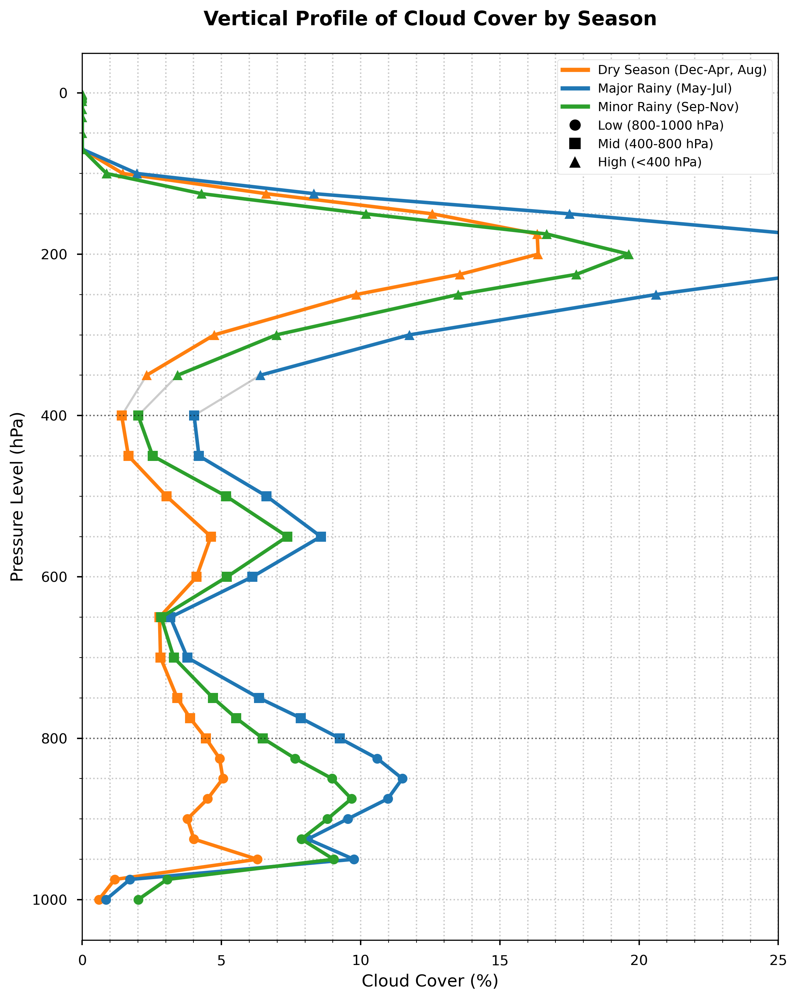

In [55]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import AutoMinorLocator

# Load the data
file_path_dry = "cloud_output/dry_season.nc"
file_path_rainy = "cloud_output/major_rainy.nc"
file_path_rainy_minor = "cloud_output/minor_rainy.nc"

ds_dry = xr.open_dataset(file_path_dry)
ds_rainy = xr.open_dataset(file_path_rainy)
ds_minor = xr.open_dataset(file_path_rainy_minor)

# Function to process and plot vertical profile
def plot_vertical_profile(ax, ds, title, color):
    # Reduce dimensions by averaging over longitude and latitude
    ds_avg = ds.mean(dim=['longitude', 'latitude'])
    
    # Extract the cloud cover data and convert to percentage
    cc_data = ds_avg['cc'].squeeze().values * 100
    
    # Extract pressure levels
    pressure_levels = ds_avg['pressure_level'].values
    
    # Ensure cc_data and pressure_levels have the same shape
    if cc_data.ndim > 1:
        cc_data = cc_data.mean(axis=0)
    
    # Define level boundaries and connection points
    LEVELS = {
        'Low': {'range': (800, 1000), 'color': color, 'marker': 'o'},
        'Mid': {'range': (400, 800), 'color': color, 'marker': 's'},
        'High': {'range': (0, 400), 'color': color, 'marker': '^'}
    }
    
    # First plot all points together to ensure connection
    full_mask = pressure_levels <= 1000  # Include all valid points
    ax.plot(cc_data[full_mask], pressure_levels[full_mask], 
            'k-', alpha=0.2, linewidth=1.5, zorder=1)
    
    # Then plot each level with connection points
    for name, props in LEVELS.items():
        bottom, top = props['range']
        if name == 'High':
            mask = pressure_levels < top
            # Include one extra point from Mid range for connection
            connection_point = np.sum(pressure_levels >= top)
            if connection_point < len(pressure_levels):
                mask[connection_point] = True
        elif name == 'Mid':
            mask = (pressure_levels >= bottom) & (pressure_levels <= top)
            # Include one extra point from Low range for connection
            connection_point = np.sum(pressure_levels > top)
            if connection_point < len(pressure_levels):
                mask[connection_point] = True
        else:
            mask = (pressure_levels >= bottom) & (pressure_levels <= top)
        
        ax.plot(cc_data[mask], pressure_levels[mask],
                color=props['color'],
                linewidth=2.5,
                marker=props['marker'],
                markersize=7,
                markeredgecolor='w',
                markerfacecolor=props['color'],
                zorder=2)
    
    return cc_data, pressure_levels

# Create figure
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
plt.style.use('seaborn-v0_8-notebook')

# Define season colors
season_colors = {
    'Dry Season': '#FF7F0E',        # Orange
    'Major Rainy Season': '#1F77B4', # Blue
    'Minor Rainy Season': '#2CA02C'  # Green
}

# Plot all seasons
plot_vertical_profile(ax, ds_dry, 'Dry Season', season_colors['Dry Season'])
plot_vertical_profile(ax, ds_rainy, 'Major Rainy Season', season_colors['Major Rainy Season'])
plot_vertical_profile(ax, ds_minor, 'Minor Rainy Season', season_colors['Minor Rainy Season'])

# Create custom legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color=season_colors['Dry Season'], lw=3, label='Dry Season (Dec-Apr, Aug)'),
    Line2D([0], [0], color=season_colors['Major Rainy Season'], lw=3, label='Major Rainy (May-Jul)'),
    Line2D([0], [0], color=season_colors['Minor Rainy Season'], lw=3, label='Minor Rainy (Sep-Nov)'),
    Line2D([0], [0], marker='o', color='k', label='Low (800-1000 hPa)',
           markersize=8, linestyle='None', markeredgecolor='w'),
    Line2D([0], [0], marker='s', color='k', label='Mid (400-800 hPa)',
           markersize=8, linestyle='None', markeredgecolor='w'),
    Line2D([0], [0], marker='^', color='k', label='High (<400 hPa)',
           markersize=8, linestyle='None', markeredgecolor='w')
]

# Enhanced plot customization
ax.set_title('Vertical Profile of Cloud Cover by Season', fontsize=14, pad=20, fontweight='bold')
ax.set_xlabel('Cloud Cover (%)', fontsize=12)
ax.set_ylabel('Pressure Level (hPa)', fontsize=12)
ax.grid(True, which='both', linestyle=':', alpha=0.7)
ax.legend(handles=legend_elements, frameon=True, framealpha=1, 
          loc='upper right', fontsize=9, bbox_to_anchor=(1, 1))

# Axis formatting
ax.set_xlim(0, 25)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.invert_yaxis()

# Add level boundaries
for boundary in [400, 800]:
    ax.axhline(boundary, color='k', linestyle=':', alpha=0.5, linewidth=1)

plt.tight_layout()

# Save figures
output_path = "cloud_vertical_profile_comparison"
for fmt in ['.png', '.svg', '.pdf']:
    plt.savefig(f"{output_path}{fmt}", bbox_inches='tight', dpi=300, facecolor='white')
    print(f"Saved: {output_path}{fmt}")

plt.show()

# Close the datasets after plotting
ds_dry.close()
ds_rainy.close()
ds_minor.close()